In [132]:
!pip install nltk cdlib wordcloud color-it 

## Text pre-processing: from post to network

In [133]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from collections import Counter
import string
from nltk.corpus import stopwords
import os
from nltk.stem.snowball import SnowballStemmer

nltk.download('punkt')
nltk.download('wordnet') 
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /home/datalore/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/datalore/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/datalore/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [134]:
def split_text_into_semantic_units(text):
    sentences = sent_tokenize(text)
    return sentences

lemmatizer = WordNetLemmatizer()
stemmer = SnowballStemmer("english")
puncs = string.punctuation + ''.join(['"', "''", "״", "״"])

def preprocess_word(word):
    new_word = word.lower()
    new_word = lemmatizer.lemmatize(new_word)
    new_word = stemmer.stem(new_word)
    new_word = new_word.translate(str.maketrans('', '', puncs))
    return new_word

In [135]:
df = pd.read_csv("posts_ASD_Typical_filtered12.csv")
threshold_length = 20
df = df[df['text'].str.split().str.len() >= threshold_length]
df['semantic_units'] = df['text'].apply(split_text_into_semantic_units)

In [136]:
df.groupby(["subreddit", "ASD"])["user_name"].count()

subreddit ASD 
Advice False 44
 True 28
AmItheAsshole False 45
 True 13
Anxiety False 43
 True 26
AskDocs False 45
 True 36
AskVet False 44
 True 15
Dreams False 38
 True 9
HomeImprovement False 42
 True 10
NoStupidQuestions False 23
 True 35
TrueOffMyChest False 45
 True 14
antiwork False 25
 True 36
cats False 13
 True 20
depression False 44
 True 40
dogs False 42
 True 15
offmychest False 45
 True 18
personalfinance False 45
 True 15
raisedbynarcissists False 39
 True 75
rant False 42
 True 10
relationship_advice False 45
 True 18
Name: user_name, dtype: int64

In [137]:
stop_words = list(set(stopwords.words('english')))
stop_words = [preprocess_word(w) for w in stop_words]

### compute basic metrics on semantic unit

In [138]:
import numpy as np
for sub_reddit in ['depression', 'raisedbynarcissists', 'AskDocs', 'Anxiety']:
    curr_df = df[df.subreddit == sub_reddit]
    print(f"{sub_reddit}")
    for flag in [True, False]:
        curr_df_flag = curr_df[curr_df.ASD == flag]
        n_units = curr_df_flag['semantic_units'].apply(lambda x: len(x))
        len_units = curr_df_flag['semantic_units'].apply(lambda x: np.median([len(y) for y in x]))
        print(f"asd={flag} mean number of semantic units: {round(np.mean(n_units),3)}, median len of each unit: {round(np.median(len_units),3)}")

depression
asd=True mean number of semantic units: 15.9, median len of each unit: 67.75
asd=False mean number of semantic units: 13.045, median len of each unit: 71.5
raisedbynarcissists
asd=True mean number of semantic units: 15.053, median len of each unit: 74.5
asd=False mean number of semantic units: 19.308, median len of each unit: 79.0
AskDocs
asd=True mean number of semantic units: 13.25, median len of each unit: 94.5
asd=False mean number of semantic units: 8.467, median len of each unit: 82.0
Anxiety
asd=True mean number of semantic units: 10.923, median len of each unit: 93.75
asd=False mean number of semantic units: 9.605, median len of each unit: 93.0


In [139]:
def parse_pairs(df):
    for index, row in df.iterrows():
        word_pairs_freq = Counter()
        semantic_units = row['semantic_units']
        for unit in semantic_units:
            words = word_tokenize(unit)
            word_pairs = set()
            for wordi in words:
                for wordj in words:
                    if wordi != wordj:
                        new_wordi = preprocess_word(wordi)
                        new_wordj = preprocess_word(wordj)
                        if new_wordi == "" or new_wordj == "":
                            continue
                        pair = tuple(sorted([new_wordi, new_wordj]))
                        word_pairs.add(pair)
            
            word_pairs = list(word_pairs)
            word_pairs_c = Counter(word_pairs)
            word_pairs_freq += word_pairs_c

        final_rows = [[keys[0], keys[1], value] for keys, value in dict(word_pairs_freq).items()]
        yield final_rows, index

#### save result to file

In [140]:
subreddits = ['depression', 'raisedbynarcissists', 'AskDocs', 'Anxiety']
for sr in subreddits:
    print(sr)
    dfs = []
    df_curr = df[df.subreddit == sr]
    print(df_curr.groupby(["subreddit", "ASD"])["user_name"].count())
    for flag in [False, True]:
        print(flag)
        df_curr_flag = df_curr[df_curr.ASD == flag]
        print(len(df_curr_flag))
        for post_list, index in parse_pairs(df_curr_flag):
            df_tmp = pd.DataFrame(post_list, columns=["source", "target", "weight"])
            df_tmp["index_df"]= index
            df_tmp["subreddit"]= sr
            df_tmp["asd"] = flag
            df_tmp["post"]= df_curr.loc[index, 'text']
            df_tmp["user"]= df_curr.loc[index, 'user_name']
            dfs.append(df_tmp)

    df_final = pd.concat(dfs, axis=0)
    # df_final.to_csv(os.path.join("/data/notebook_files/networks2", f"{sr}.csv"))

depression
subreddit   ASD  
depression  False    44
            True     40
Name: user_name, dtype: int64
False
44
True
40
raisedbynarcissists
subreddit            ASD  
raisedbynarcissists  False    39
                     True     75
Name: user_name, dtype: int64
False
39
True
75
AskDocs
subreddit  ASD  
AskDocs    False    45
           True     36
Name: user_name, dtype: int64
False
45
True
36
Anxiety
subreddit  ASD  
Anxiety    False    43
           True     26
Name: user_name, dtype: int64
False
43
True
26


## Setup:
### Subreddits 
- Depression
- raisedbynarc
- AskDocs
- Anxiety

We chose above as they have the most ASD users

### Data setting
Each network represents the connection of words inside semantic units of **post**

For specific Subreddit - depression: check for 3 different settings:
- All words
- Stop words only
- Filter out stop words

Fo each subreddit:
- shared words between the groups
- unique words for each group

### Compare metric distributions between asd/non_asd for each subreddit:
1. Word Cloud — in each Subreddit, for both groups
2. average/median/precintials degree
3. Average path length
4. Centrality:
    1. closeness
    2. betweeness 
5. Community — over all posts, and per post:
    1. louvain algorithm - community size and number of communities
    2. clustering coefficient
    3. modularity
   
### For each of the above metric we will preform 2 statistical test:

- Z test - for difference of means 
    - we can only approximate via normality assumption (<30 networks in asd groups), thus we cannot do t-test.
- Levene test - for difference of variance
   

**** we correct $\alpha = 0.05$ to $\alpha' = \frac{0.05}{4}$

### Data preprocessing - creating networkx objects

In [141]:
names_csvs= ['depression.csv', 'raisedbynarcissists.csv', 'AskDocs.csv', 'Anxiety.csv']
path = 'networks2'
subred_dict = {'depression.csv': 'depression',
              'raisedbynarcissists.csv': 'rbn',
              'AskDocs.csv': 'AskDocs',
               'Anxiety.csv': 'Anxiety'}
dfs ={
    'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}
} 

In [142]:
stop_words = list(set(stopwords.words('english')))
stop_words = [preprocess_word(w) for w in stop_words]
stop_words

['each',
 'then',
 'our',
 'ain',
 'them',
 'abov',
 'with',
 'most',
 've',
 'for',
 'o',
 'our',
 'what',
 'below',
 'no',
 'your',
 'up',
 'couldnt',
 'further',
 'few',
 'not',
 'be',
 'doesn',
 'shouldn',
 'through',
 'in',
 'll',
 're',
 'she',
 'nor',
 'hadn',
 'while',
 'all',
 'he',
 'into',
 'dure',
 'couldn',
 'too',
 'same',
 'which',
 'do',
 'arent',
 'y',
 'ha',
 'out',
 'itself',
 'under',
 'is',
 'to',
 'than',
 'have',
 'isnt',
 'their',
 'an',
 'didn',
 'befor',
 'needn',
 'did',
 'weren',
 'youd',
 'had',
 'more',
 'her',
 'that',
 'these',
 'onli',
 'have',
 'on',
 'until',
 'from',
 'been',
 'doesnt',
 'hadnt',
 'isn',
 'off',
 'doe',
 'between',
 'wasn',
 'yourself',
 'against',
 'those',
 'other',
 'veri',
 'some',
 'haven',
 'here',
 'your',
 'hasn',
 'me',
 'mightn',
 'both',
 'were',
 'they',
 'of',
 'the',
 'd',
 'youv',
 'such',
 'at',
 'wouldnt',
 'wont',
 'herself',
 'your',
 'how',
 'm',
 'neednt',
 'ourselv',
 'we',
 't',
 'but',
 'my',
 'dont',
 'down',

In [143]:
import copy
for csv in names_csvs:
    print(csv)
    sub_reddit = subred_dict[csv] 
    raw_df = pd.read_csv(os.path.join(path,csv))

    # Filter out rows where either the "source" or "target" column contains a stop word
    df = raw_df[~(raw_df['source'].isin(stop_words) | raw_df['target'].isin(stop_words))]

    uids = {"True": [], "False": []}
    for flag in [True, False]:
        df_flag = df[df['asd']==flag]
        print(f"{sub_reddit}: {flag}")

        for idx in  df_flag.index_df.unique():
            df_idx = df_flag[df_flag.index_df == idx]
            user = df_idx['user'].values[0]
            if user in uids[str(flag)]:
                continue
            else:
                uids[str(flag)].append(user)
                df_idx_copy = copy.deepcopy(df_idx)
                if flag:
                    dfs[sub_reddit]["asd"].append(df_idx_copy)
                else:
                    dfs[sub_reddit]["nonasd"].append(df_idx_copy)

depression.csv
depression: True
depression: False
raisedbynarcissists.csv
rbn: True
rbn: False
AskDocs.csv
AskDocs: True
AskDocs: False
Anxiety.csv
Anxiety: True
Anxiety: False


In [144]:
import networkx as nx

network ={
    'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}
} 

for subreddit, subreddit_dict in dfs.items():
    for group in subreddit_dict.keys():
        df_list = subreddit_dict[group]
        for df in df_list:
            subset_df = df[["source", "target", "weight"]]
            G = nx.Graph()
            G = nx.from_pandas_edgelist(subset_df, edge_attr="weight", create_using=G)
            network[subreddit][group].append(G)

## Data vizualization

#### number of unique users in each group, subreddit

In [145]:
categories = ['depression', 'rbn', 'AskDocs', 'Anxiety']
labels = ['asd', 'nonasd']

for category in categories:
    for label in labels:
        dfs_list = dfs[category][label] 
        print(f"{category}, {label}")
        print(len(dfs_list))

depression, asd
13
depression, nonasd
43
rbn, asd
20
rbn, nonasd
39
AskDocs, asd
18
AskDocs, nonasd
45
Anxiety, asd
16
Anxiety, nonasd
42


In [146]:
import matplotlib.pyplot as plt
import numpy as np

def plot_network(category, label):
    plt.figure(figsize=(20, 20))
    df_list = dfs[category][label]
    sampled_df_idx = np.random.choice(range(len(df_list)))
    df_sample = df_list[sampled_df_idx]
    post = df_sample['post'].values[0]
    user = df_sample['user'].values[0]
    weights = np.array(df_sample['weight'])
    normalized_w = weights / np.max(weights)

    G = nx.Graph()
    G = nx.from_pandas_edgelist(df_sample, edge_attr='weight', create_using=G)
    print(user)
    print(post)
    pos = nx.circular_layout(G)  # Positions of the nodes in a circular layout
    labels = {node: node for node in G.nodes()}  # Assigning node names as labels

    nx.draw_networkx_nodes(G, pos, node_size=25)
    nx.draw_networkx_edges(G, pos, width=normalized_w)
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=10, font_color=(128 / 255, 0, 0), verticalalignment='bottom', bbox=dict(facecolor='white', edgecolor='none', pad=0.3))

    plt.title(f'{category}, {label} sampled network')
    plt.show()

HofmansHuffy
The last several months I’ve become increasingly certain that I am autistic. I identify with nearly every common trait attributed to ASD. I think I can afford to get properly diagnosed, but I’m afraid of the result not being what I expect. If I don’t get a diagnosis, I’m going to feel like an imposter. Maybe I am just making everything up in my head. I have a long history of over analyzing everything and getting ahead of myself. If I’m not autistic that means that the mystery of why I am the way that I am is simply because I’m a chemically unbalanced loon. 

Conversely, if I do get an ASD diagnosis, how is everyone around me going to treat me? Would I even tell them? They could see me as even more of an ultra-sensitive basket case. What if it makes them uncomfortable to be my friend? Or maybe they choose to believe I’m lying. I’ve tried explaining the similarities I’ve found with myself and ASD and some friends have flat out said “even if you are, you can’t blame everythin

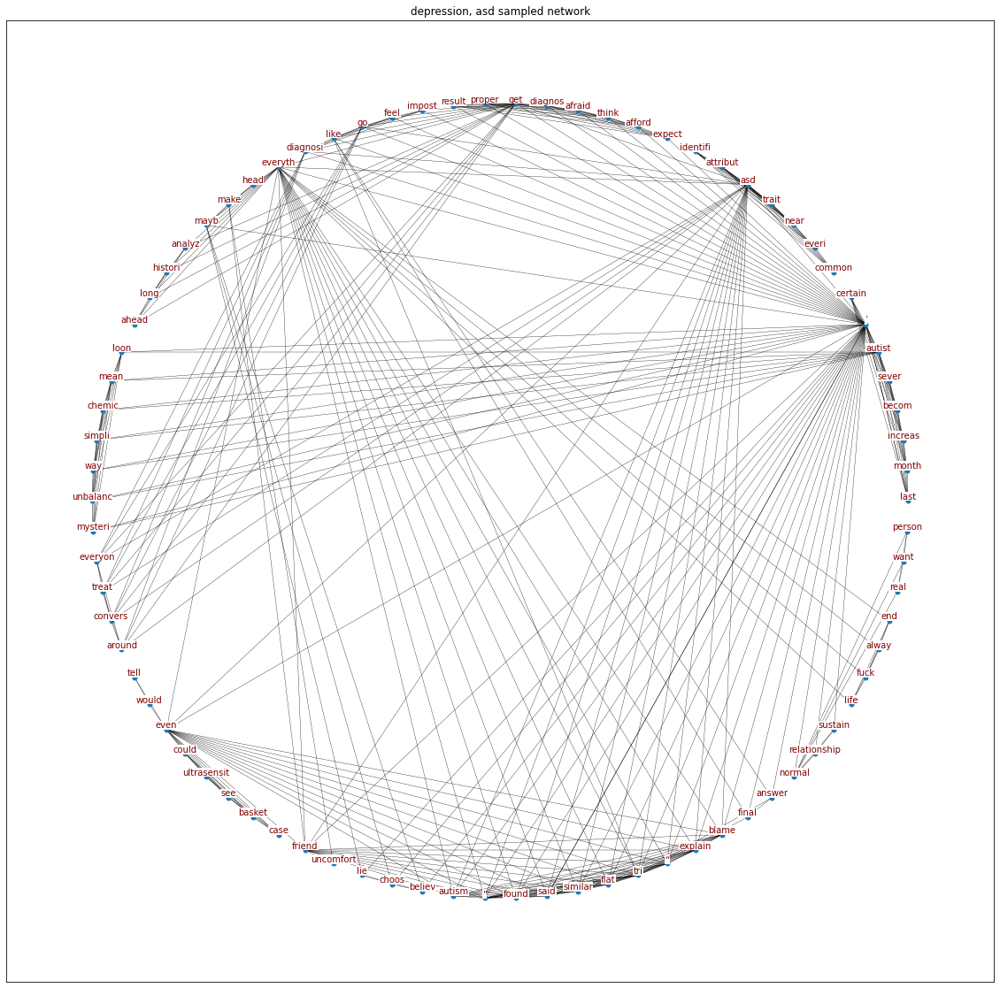

In [147]:
plot_network(categories[0], labels[0])

hidingmyself12
I don’t feel like I can do this one more day. I can’t get up anymore. I can’t work. I just can’t. One more breath is just too much. 

Is it worth it?


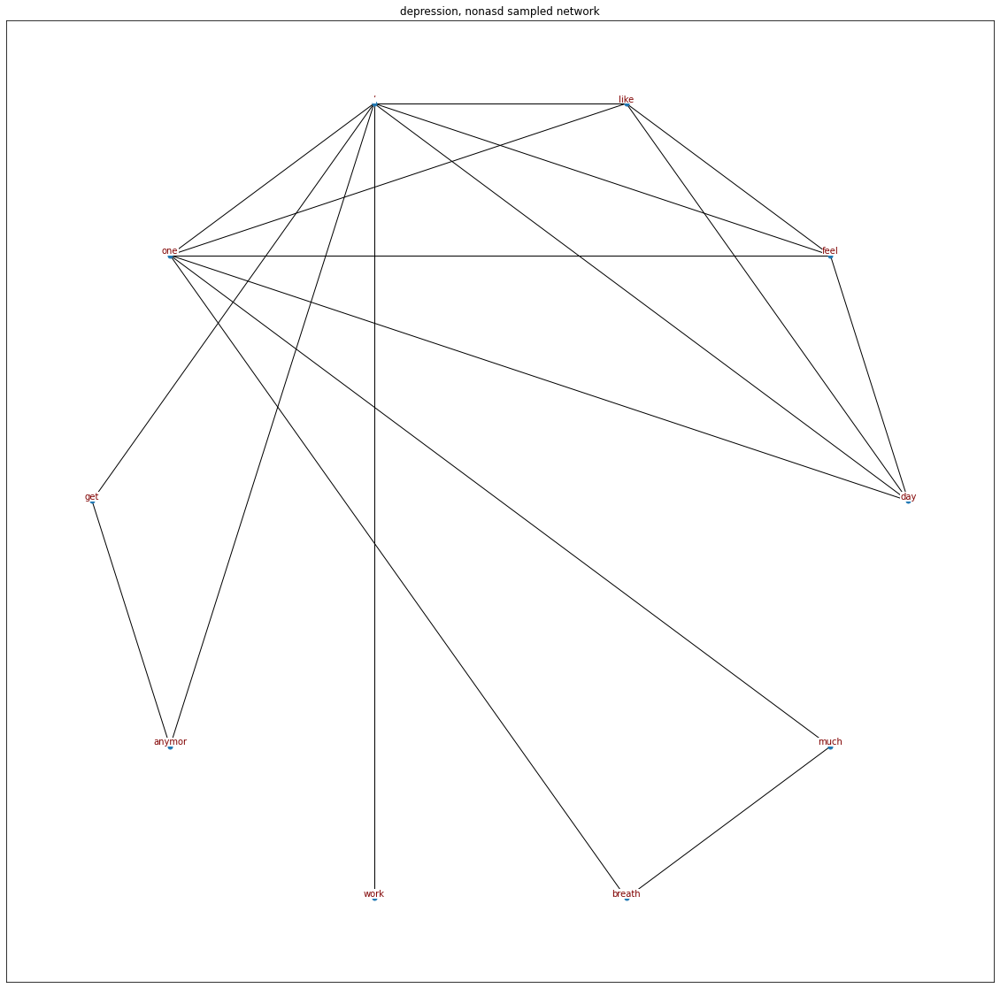

In [148]:
plot_network(categories[0], labels[1])

cyborgmonkey-
I've long feared waterfalls specifically but not other heights. I had the memory for a long time but just never thought much about it. Been NC for a few months and in emdr so stuff is coming up.

About 4 to 5. We are at the bridge spanning Multnomah falls. (Oregon's largest waterfall.) My dad asks if I want a better view. I excitedly say yes. But when he lifts me above the railing he also holds outside of it. Michael Jackson style. I remember the water far beneath me. I freaked out. He laughed when he finally pulled me back. He thought it was funny.


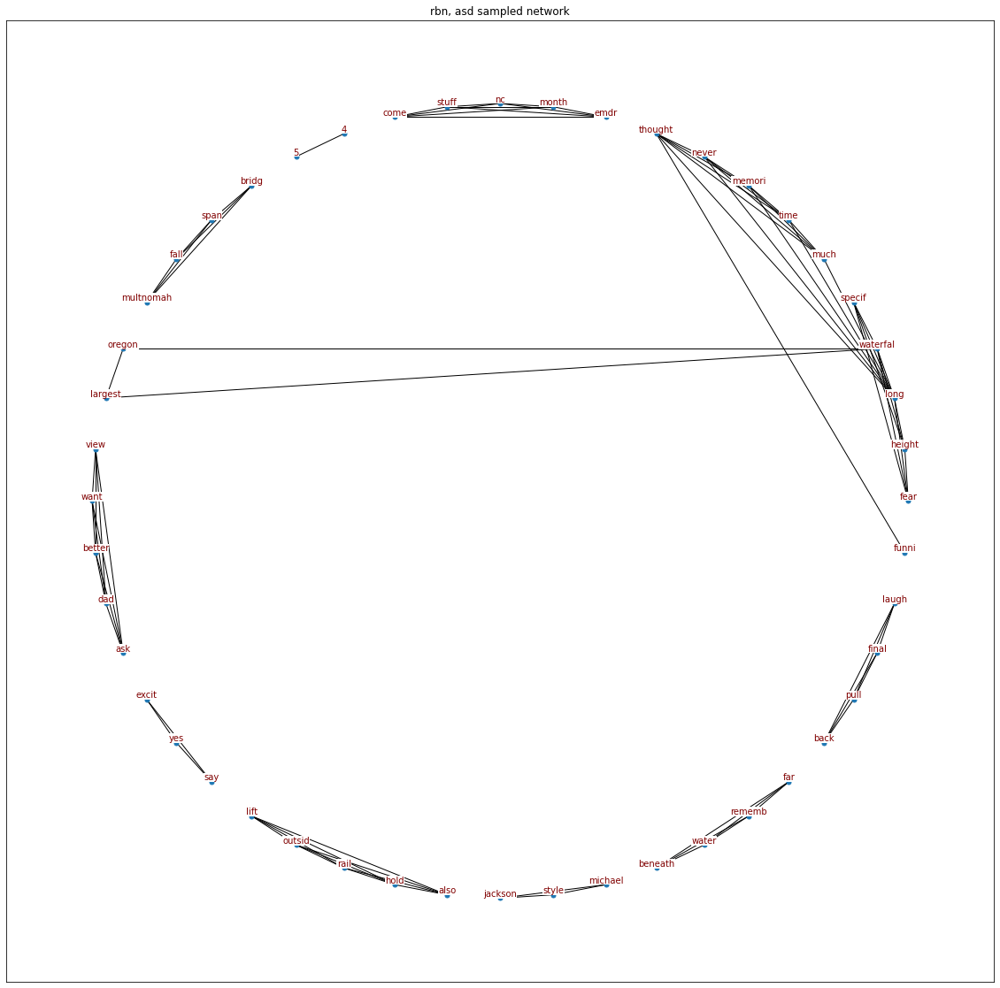

In [149]:
plot_network(categories[1], labels[0])

Liam_Disappeared
I'm 15 (m) and desperately trying to keep my family together, but I need to be able to talk to my dad about boundaries and the way he acts. But everytime anyone tried to tell him something's up with his behaviour, he gets violent and acts like he's the victim. Anyone here have some tips?


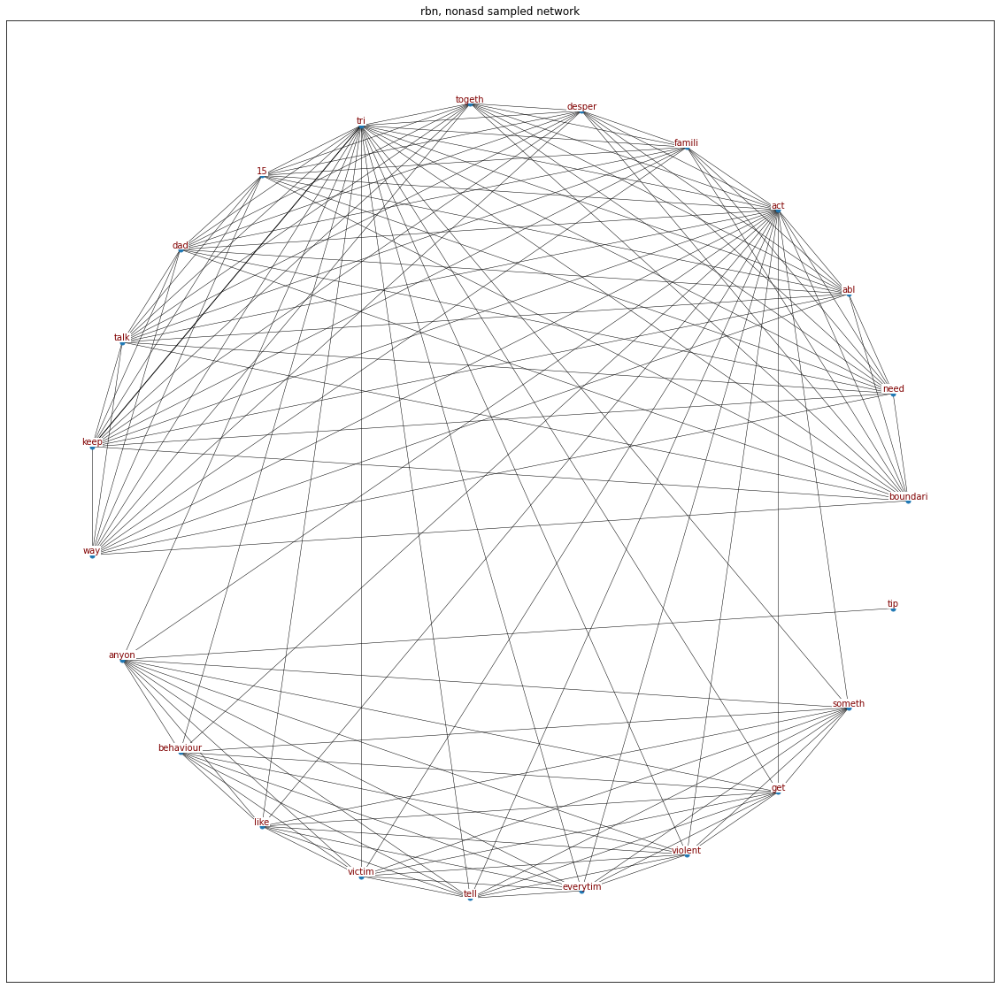

In [150]:
plot_network(categories[1], labels[1])

Atomic_Fire
Age: 27

Sex: M

Height: 6'0"

Weight: 195

Race: Caucasian

Duration of complaint: ~8 years

Location: Both Knees

Current medications: antacids as needed for GERD

Thought I'd ask here for some opinions on what could be causing this. Feel like I have the knees of a 75 year old man -- these are seriously preventing me from exercising fully. Since I was about 19, I started having knee pain when putting any sort of weight on my knees -- most pronounced during squats or lunges or stairs. 

The pain is slightly below the knee, maybe slightly towards inside on both knees. Right knee is significantly worse. Pain gets worse as it is aggravated, but if not aggravated, there is no pain. Regular walking is fine. Cycling or running for long periods cause it to act up somewhat. Leg extensions do not cause me pain, however, unless it has been aggravated already. 

Pain seems to be focused after my knee is about 1/3 to halfway extended or bent. I'd describe it as 2/10, worsening to 6/10

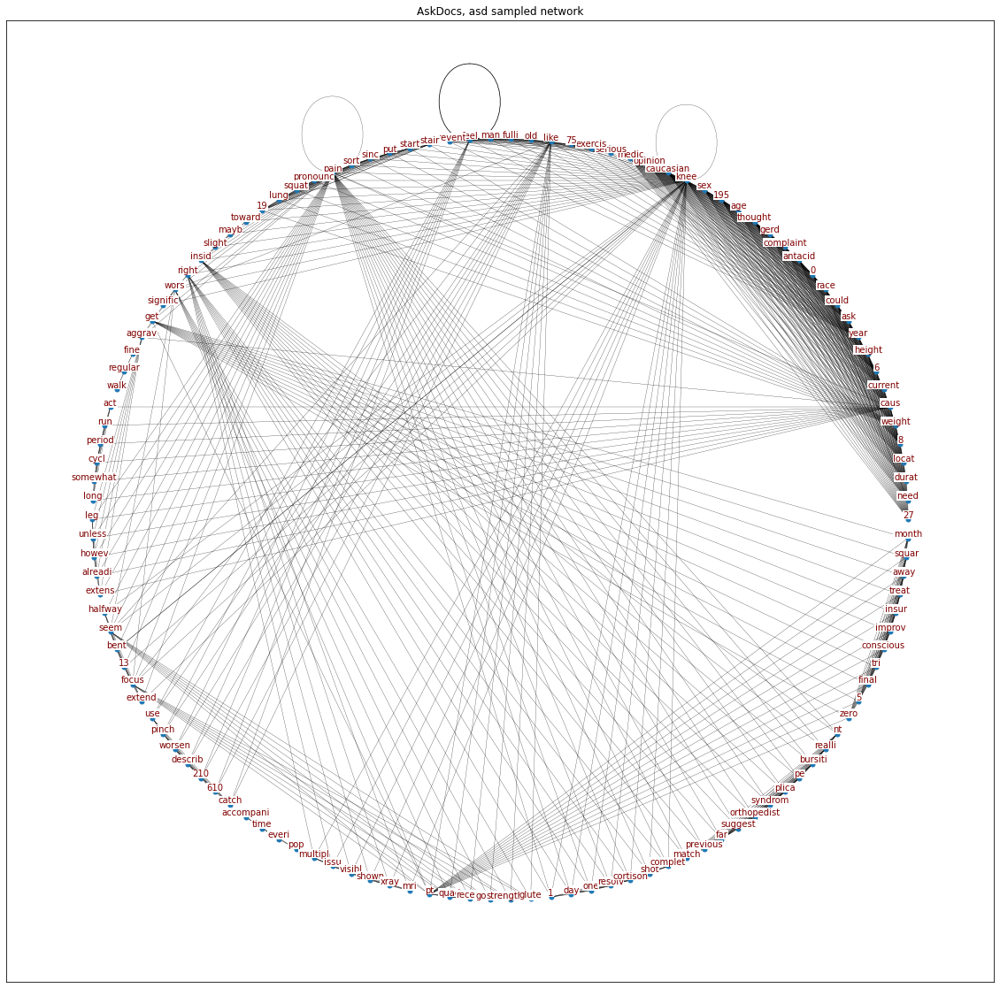

In [151]:
plot_network(categories[2], labels[0])

bluebumps
F26, normal BMI (59kg / 173cm). No health conditions. No medications other than BC.

I finally realised the common denominator when I get these symptoms: short of breath, sore gums relieved by pressure (feels like I’m teething) like pushing with knuckle, general aching and uncomfort…

Salty food (or highly fatty food). Only happens when I eat Nachos or KFC, and only starts a few hours after eating it. Doesn’t happen with every food like McDonald’s, which is why I think it might be salt being the issue (salty corn chips).

Why does this happen? Is it a sign of something?


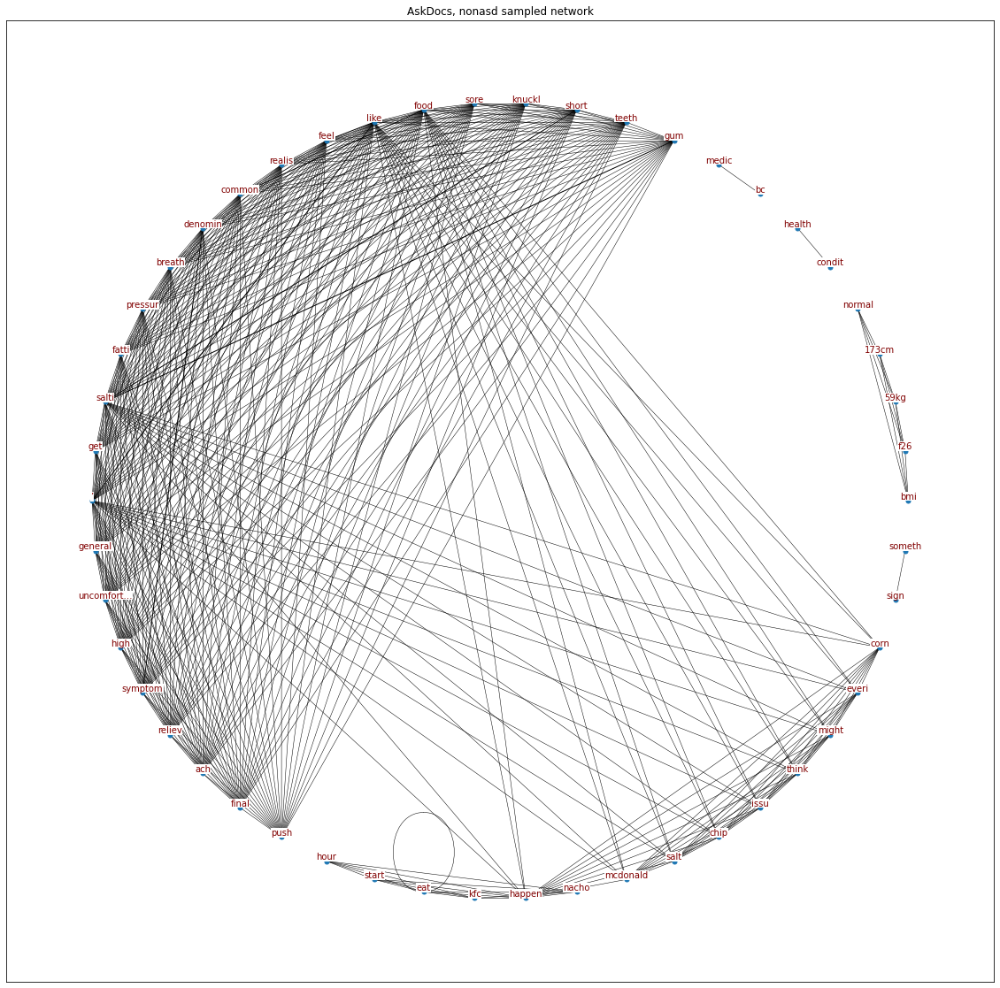

In [152]:
plot_network(categories[2], labels[1])

writeratwork94
Hello friends.

So, I have what I have come to suspect is free-floating anxiety (I suspect I may also have OCD, but that's another conversation). I believe this because I am always, always, always anxious and ruminating about something, and no matter what happens, and no matter if the thing I'm currently worrying about goes away, my brain immediately latches on with astonishing precision to whatever new thing is the juiciest target, i.e. most closely wired to my self-esteem, identity, sense of purpose, and so forth. In the words of my psychiatrist, "No one has ever come into my office and said 'Dr. -----, I've run out of things to worry about." 

So then my brain goes "We need to fix this problem with our thoughts! If you mentally torture yourself for long enough and feel sick and self-disgusted enough you will be a good person!!!!!"  The rumination is hellish. 

I've been trying to just notice the anxiety sensations (usually nausea and racing heart, sometimes a headache

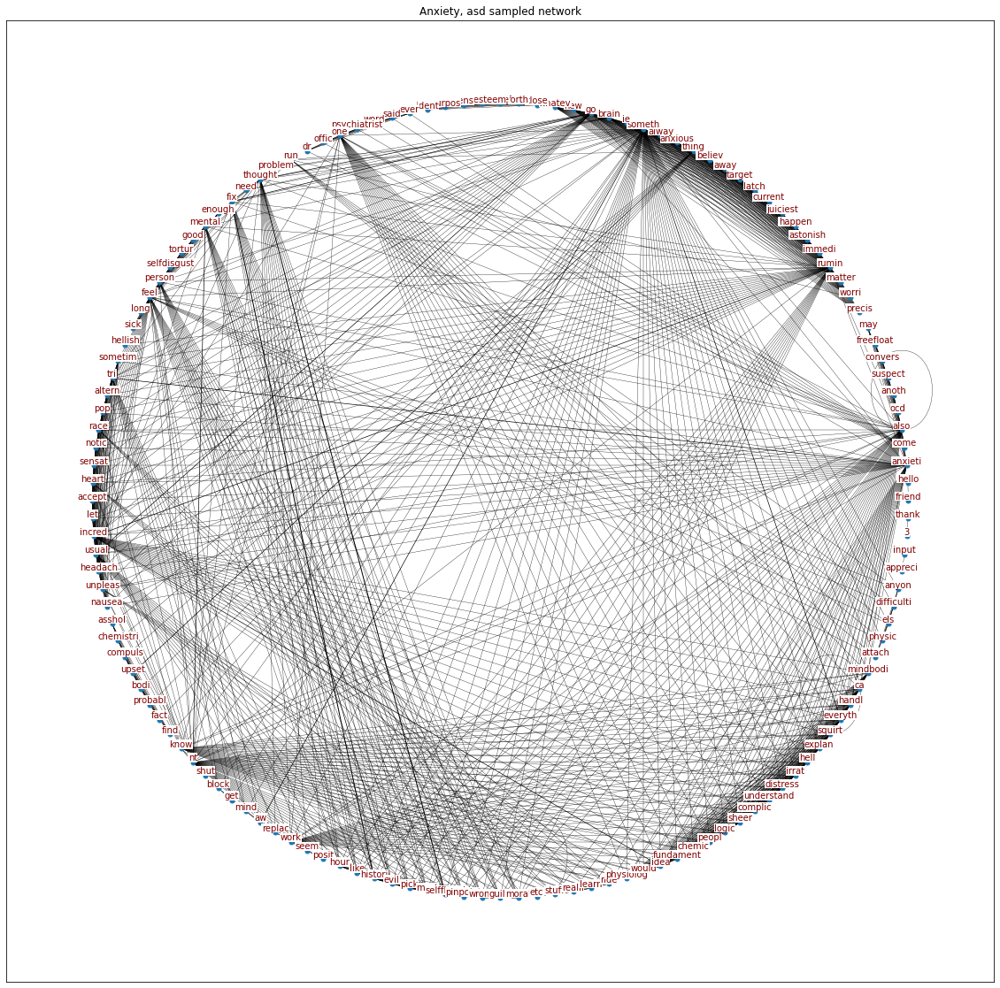

In [153]:
plot_network(categories[3], labels[0])

digital_2020
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
  
*It's important to note that while these theories provide possible explanations for the effects of propranolol on memory reconsolidation, further research is needed to fully understand its mechanisms and confirm its effectiveness in treating PTSD or reducing the emotional impact of traumatic memories.*


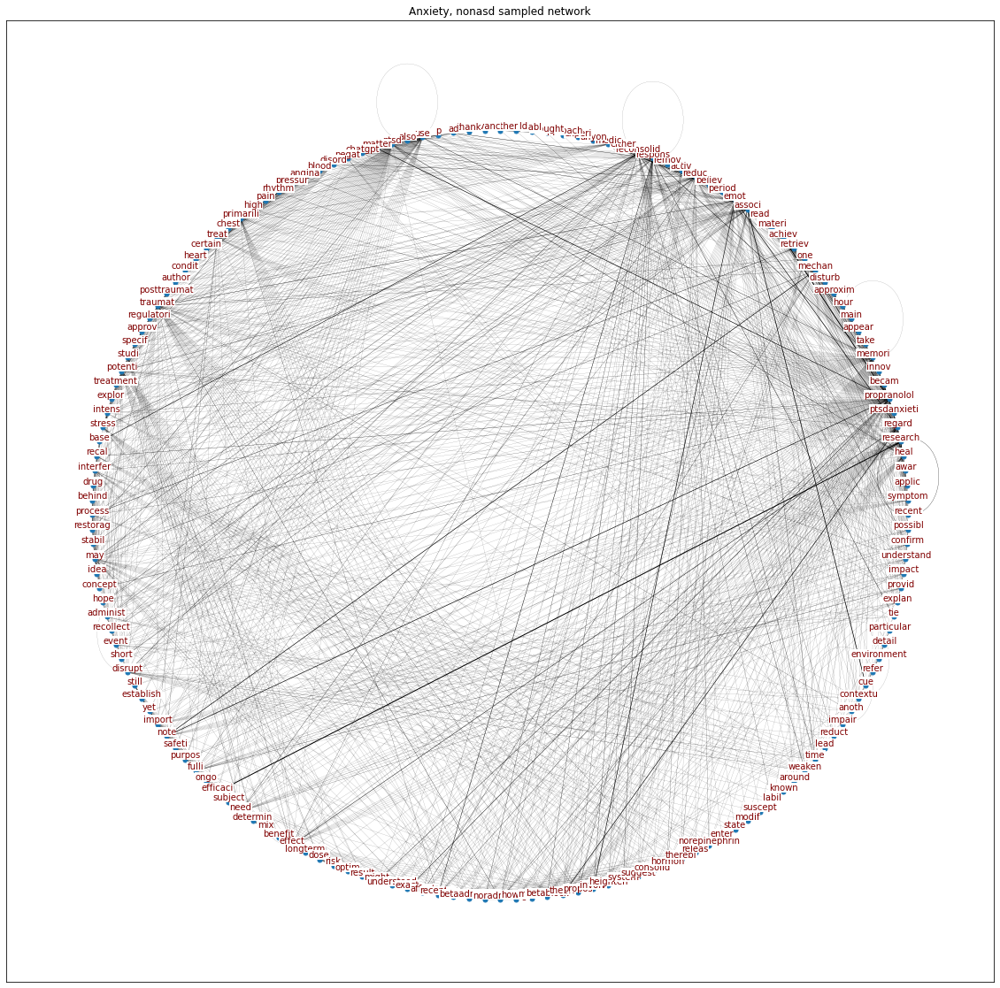

In [154]:
plot_network(categories[3], labels[1])

### plotting distributation of #nodes, #edges in each group, subreddit

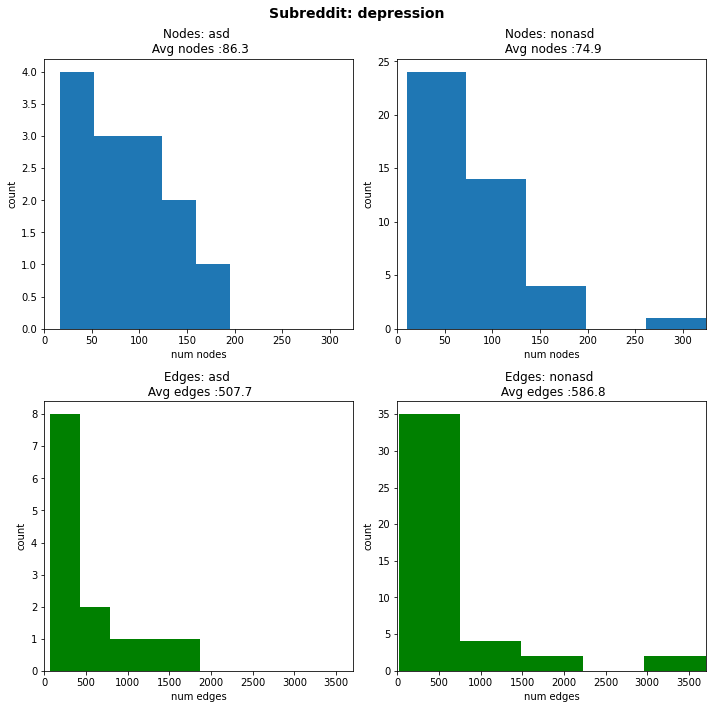

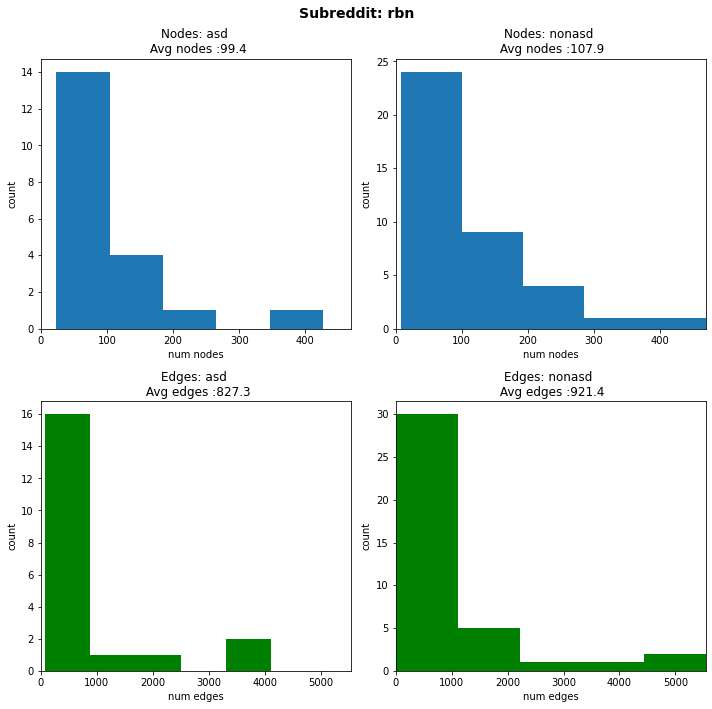

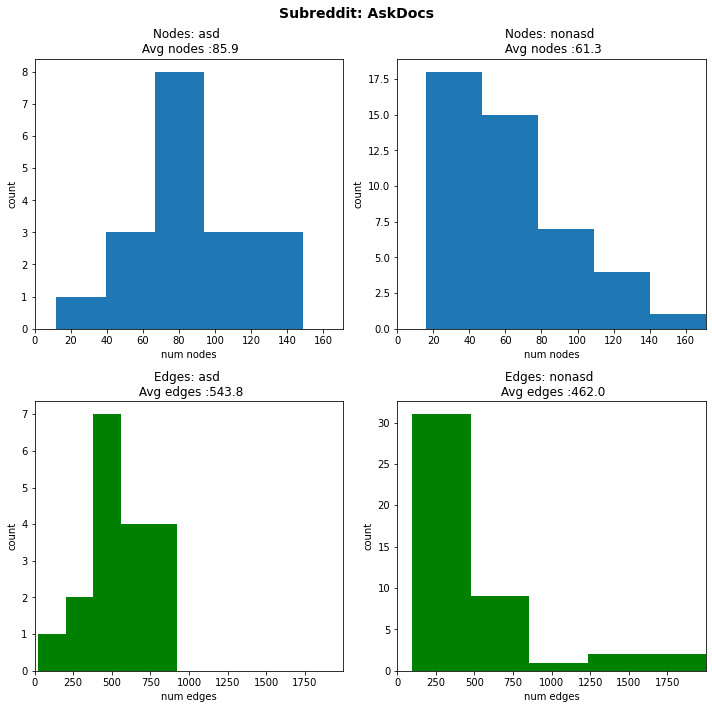

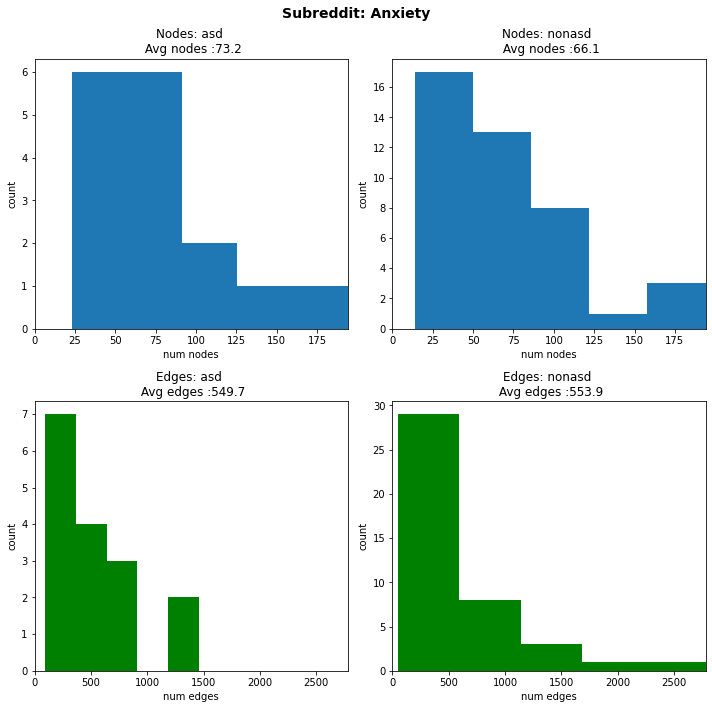

In [155]:
for c in categories:
    figs, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
    num_nodes = {'asd': [], 'nonasd': []}
    num_edges = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category
    for i, label in enumerate(['asd', 'nonasd']):
        nets = network[c][label]
        for G in nets:
            n_nodes = G.number_of_nodes()
            n_edges = G.number_of_edges()
            num_nodes[label].append(n_nodes)
            num_edges[label].append(n_edges)

    max_xlim_nodes = max([max(num_nodes['asd']), max(num_nodes['nonasd'])])
    max_xlim_edges = max([max(num_edges['asd']), max(num_edges['nonasd'])])

    for i, label in enumerate(['asd', 'nonasd']):

        ## nodes plot
        ax_node = axes[0][i]
        ax_node.hist(num_nodes[label], bins=5)
        ax_node.set_title(f'Nodes: {label} \n Avg nodes :{round(np.mean(num_nodes[label]),1)}')
        ax_node.set_xlabel('num nodes')
        ax_node.set_ylabel('count')
        ax_node.set_xlim((0, max_xlim_nodes))
        ## edges plot
        ax_edge = axes[1][i]
        ax_edge.hist(num_edges[label], bins =5, color="green")
        ax_edge.set_title(f'Edges: {label} \n Avg edges :{round(np.mean(num_edges[label]),1)}')
        ax_edge.set_xlabel('num edges')
        ax_edge.set_ylabel('count')
        ax_edge.set_xlim((0, max_xlim_edges))
    plt.tight_layout()  # Adjust subplot spacing
    plt.show()



    

#### word cloud by group, subreddit

In [156]:
!pip install wordcloud

In [157]:
import networkx as nx
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import random

# Define a function to generate word clouds
def generate_word_cloud(subreddit, group, words, ax):
    ax.set_title(f"Word Cloud - Subreddit: {subreddit}, Group: {group}")
    wordcloud = WordCloud(background_color='white').generate(' '.join(words))
    ax.imshow(wordcloud, interpolation='bilinear')

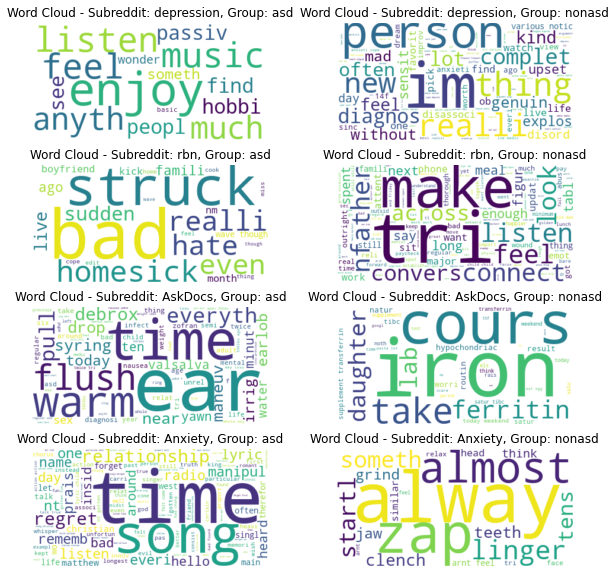

In [158]:
fig, axes = plt.subplots(nrows=len(dfs.keys()), ncols=2, figsize=(10,10))
i =0
for subreddit, subreddit_dict in dfs.items():
    j=0
    for group in subreddit_dict.keys():
        ax = axes[i, j]
        ax.axis('off')
        j+=1
        df_list = subreddit_dict[group]
        words = []
        for df in df_list:
            words = list(df["source"].values) + list(df["target"].values)
            words.extend(words)
        generate_word_cloud(subreddit, group, words, ax)
    i+=1
# plt.axis("off")
plt.show()

## Metrics Distribution

### Average degree

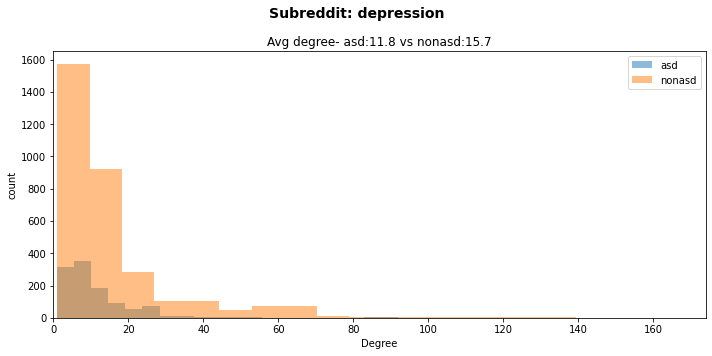

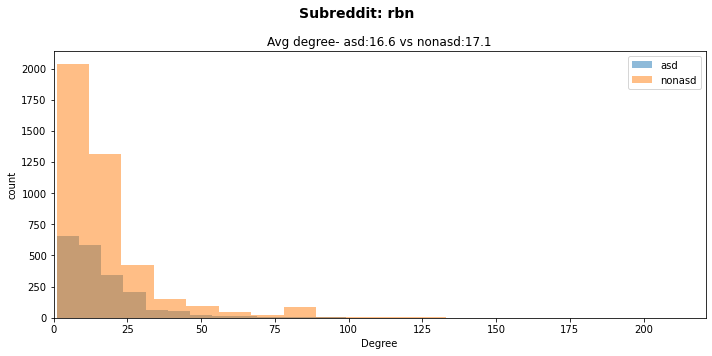

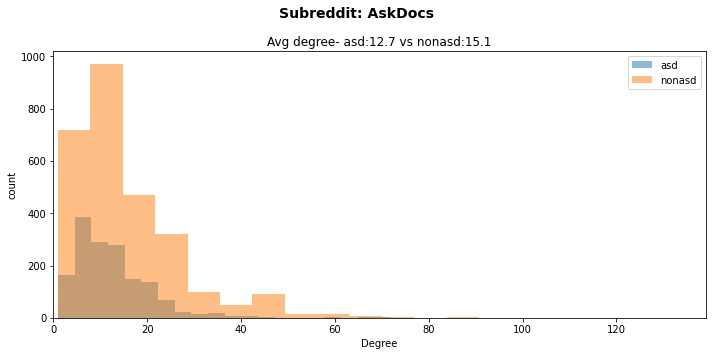

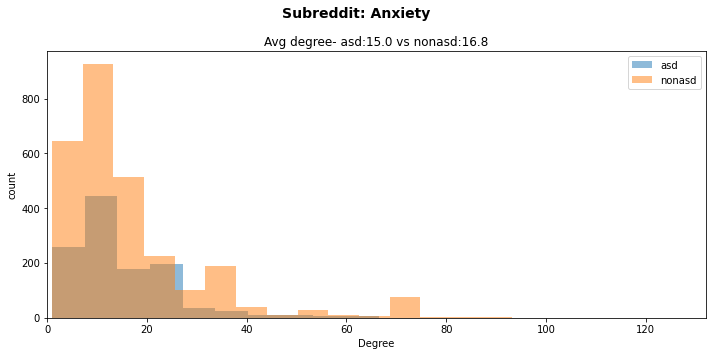

In [159]:
for c in categories:
    figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
    degrees = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category
    for i, label in enumerate(degrees.keys()):
        nets = network[c][label]
        for G in nets:
            degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
            degrees[label].extend(degree_sequence)

    max_xlim = max([max(degrees['asd']), max(degrees['nonasd'])])

    for i, label in enumerate(degrees.keys()):
        ## nodes plot
        axes.hist(degrees[label], bins=20, alpha=0.5, label=label)

    axes.set_title(f'Avg degree- asd:{round(np.mean(degrees["asd"]),1)} vs nonasd:{round(np.mean(degrees["nonasd"]),1)}')
    axes.set_xlabel('Degree')
    axes.set_ylabel('count')
    axes.set_xlim((0, max_xlim))
    plt.legend()
    plt.tight_layout()  # Adjust subplot spacing
    plt.show()

### Z test

In [160]:
from statsmodels.stats.weightstats import ztest

for c in categories:
    z_stat, p_val = ztest(avg_degrees[c]['asd'], avg_degrees[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: -0.861, p-value: 0.389
There is no significant difference

rbn
  z-statistic: 0.136, p-value: 0.892
There is no significant difference

AskDocs
  z-statistic: -1.053, p-value: 0.292
There is no significant difference

Anxiety
  z-statistic: -0.478, p-value: 0.632
There is no significant difference



### Levene test

In [161]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_degrees[c]['asd'], avg_degrees[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('There is significant difference')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.66, p-value: 0.42
There is no significant difference

rbn
  test statistic: 0.048, p-value: 0.828
There is no significant difference

AskDocs
  test statistic: 4.179, p-value: 0.045
There is no significant difference

Anxiety
  test statistic: 1.364, p-value: 0.248
There is no significant difference



### Average path len

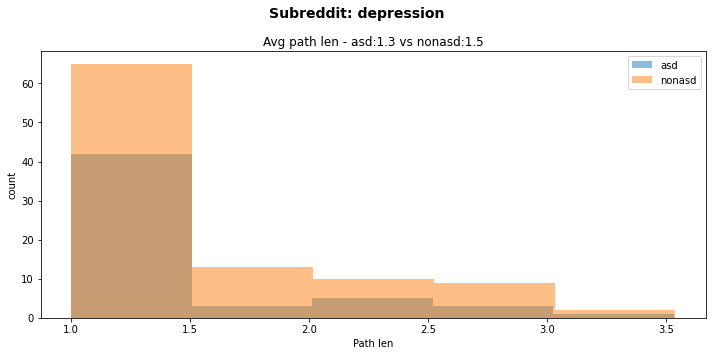

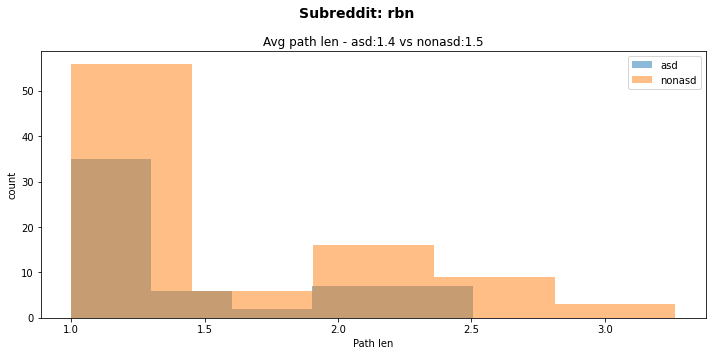

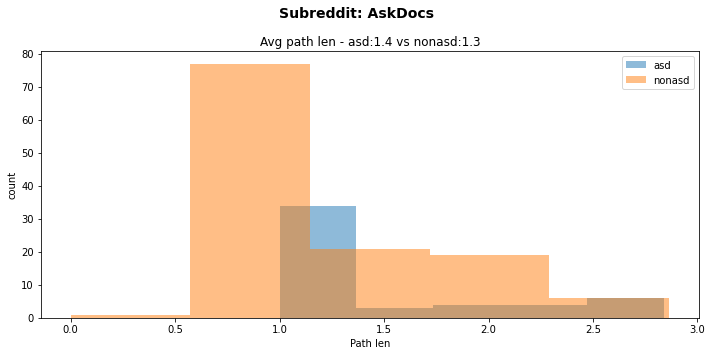

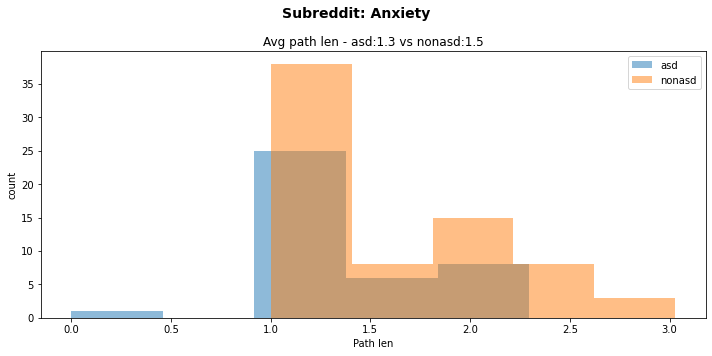

In [162]:
avg_path_lens =  {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 

for c in categories:
    figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
    metrics = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category
    for i, label in enumerate(metrics.keys()):
        nets = network[c][label]
        for G in nets:
            sequences = []
            for C in (G.subgraph(c).copy() for c in nx.connected_components(G)):
                sequence = nx.average_shortest_path_length(C)
                sequences.append(sequence)
            avg_path_lens[c][label].append(round(np.mean(sequences), 4))
            metrics[label].extend(sequences)


    for i, label in enumerate(metrics.keys()):
        ## nodes plot
        axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

    axes.set_title(f'Avg path len - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
    axes.set_xlabel('Path len')
    axes.set_ylabel('count')
    # axes.set_xlim((0, max_xlim))
    plt.legend()
    plt.tight_layout()  # Adjust subplot spacing
    plt.show()

### Z test

In [163]:
for c in categories:
    z_stat, p_val = ztest(avg_path_lens[c]['asd'], avg_path_lens[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: -0.387, p-value: 0.699
There is no significant difference

rbn
  z-statistic: -0.628, p-value: 0.53
There is no significant difference

AskDocs
  z-statistic: 1.306, p-value: 0.192
There is no significant difference

Anxiety
  z-statistic: -1.872, p-value: 0.061
There is no significant difference



### Levene Test

In [164]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_path_lens[c]['asd'], avg_path_lens[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.101, p-value: 0.752
There is no significant difference

rbn
  test statistic: 0.075, p-value: 0.785
There is no significant difference

AskDocs
  test statistic: 0.121, p-value: 0.729
There is no significant difference

Anxiety
  test statistic: 1.798, p-value: 0.185
There is no significant difference



### Degree Centrality

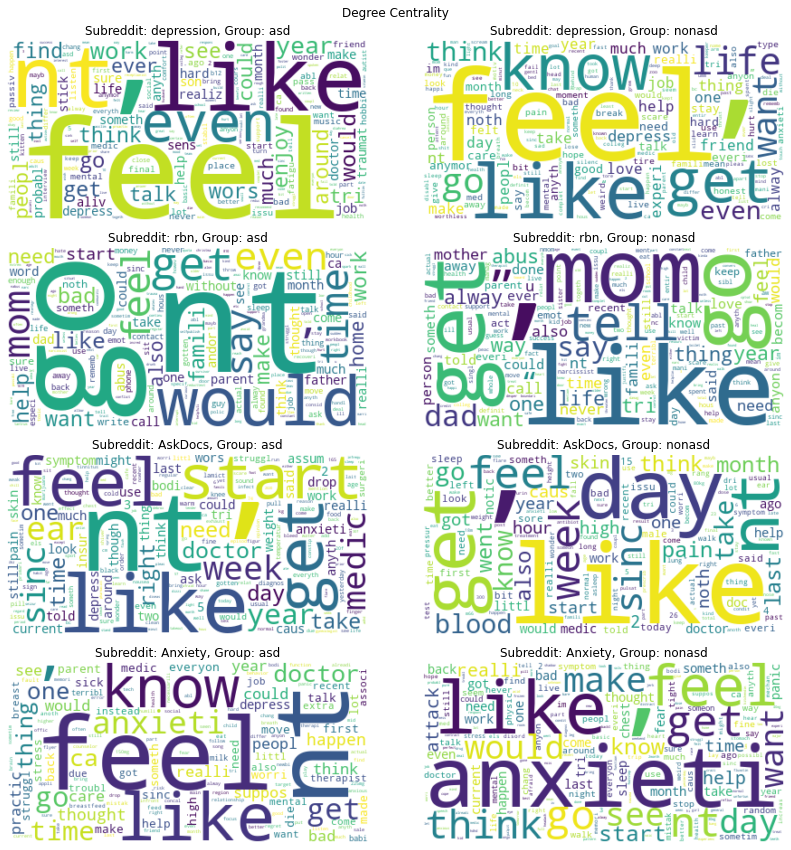

In [165]:
import networkx as nx
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming you have the necessary data and have defined the 'network' dictionary
avg_centrality =  {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 
# Create a 3 by 2 subplot
fig, axs = plt.subplots(4, 2, figsize=(12, 12))

# Flatten the subplot array for easier iteration
axs = axs.flatten()

# Iterate over each subreddit and group
for i, (subreddit, subreddit_dict) in enumerate(network.items()):
    for j, (group, graph_list) in enumerate(subreddit_dict.items()):
        # Create a dictionary to store the word frequencies
        word_freq = {}

        # Iterate over each graph in the graph_list
        for G in graph_list:
            # Get the centrality values of nodes
            centrality = nx.degree_centrality(G)
            avg_centrality[subreddit][group].append(round(np.mean(list(centrality.values())),4))

            # Iterate over each node and update the word frequency
            for node, centrality_value in centrality.items():
                word_freq[node] = word_freq.get(node, 0) + centrality_value

        # Generate a word cloud using the word frequency
        wordcloud = WordCloud(background_color='white').generate_from_frequencies(word_freq)

        # Plot the word cloud on the corresponding subplot
        axs[i * 2 + j].imshow(wordcloud, interpolation='bilinear')
        axs[i * 2 + j].set_title(f'Subreddit: {subreddit}, Group: {group}')
        axs[i * 2 + j].axis('off')

# Adjust subplot spacing and display the plot
plt.suptitle("Degree Centrality")
plt.tight_layout()
plt.show()

### z test

In [166]:
# avg_degree_centrality
for c in categories:
    z_stat, p_val = ztest(avg_centrality[c]['asd'], avg_centrality[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: -1.217, p-value: 0.224
There is no significant difference

rbn
  z-statistic: -0.061, p-value: 0.952
There is no significant difference

AskDocs
  z-statistic: -2.357, p-value: 0.018
There is no significant difference

Anxiety
  z-statistic: -1.237, p-value: 0.216
There is no significant difference



### Levene Test

In [167]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_centrality[c]['asd'], avg_centrality[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.448, p-value: 0.506
There is no significant difference

rbn
  test statistic: 0.211, p-value: 0.647
There is no significant difference

AskDocs
  test statistic: 3.694, p-value: 0.059
There is no significant difference

Anxiety
  test statistic: 2.4, p-value: 0.127
There is no significant difference



### Closeness Centrality

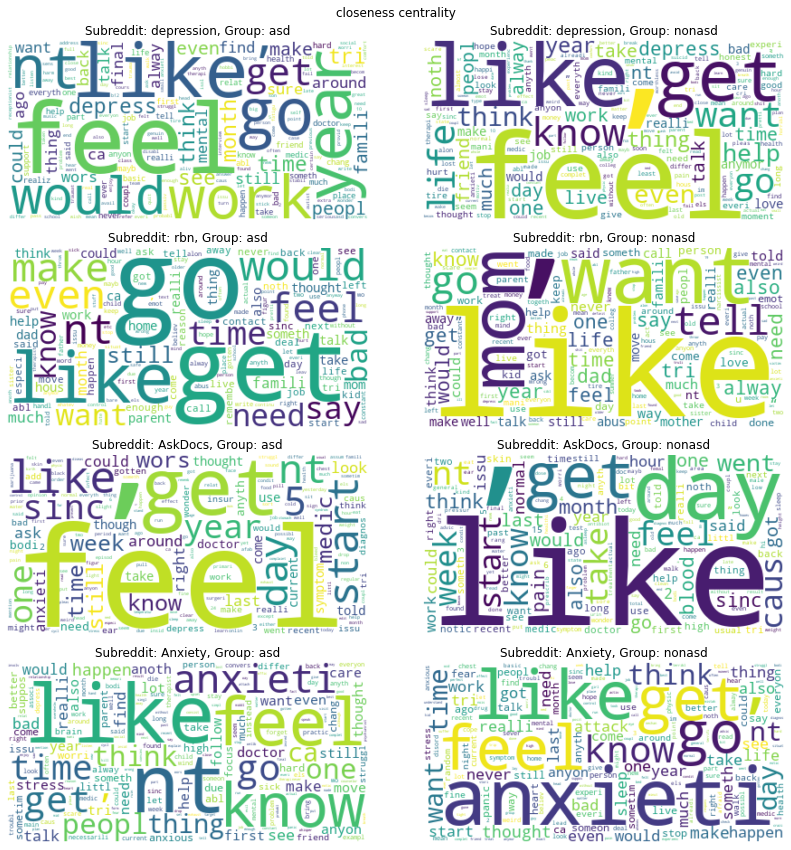

In [168]:
import networkx as nx
import matplotlib.pyplot as plt
from wordcloud import WordCloud

avg_centrality =  {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 
# Assuming you have the necessary data and have defined the 'network' dictionary

# Create a 3 by 2 subplot
fig, axs = plt.subplots(4, 2, figsize=(12, 12))

# Flatten the subplot array for easier iteration
axs = axs.flatten()

# Iterate over each subreddit and group
for i, (subreddit, subreddit_dict) in enumerate(network.items()):
    for j, (group, graph_list) in enumerate(subreddit_dict.items()):
        # Create a dictionary to store the word frequencies
        word_freq = {}

        # Iterate over each graph in the graph_list
        for G in graph_list:
            # Get the centrality values of nodes
            centrality = nx.closeness_centrality(G)

            avg_centrality[subreddit][group].append(round(np.mean(list(centrality.values())),4))

            # Iterate over each node and update the word frequency
            for node, centrality_value in centrality.items():
                word_freq[node] = word_freq.get(node, 0) + centrality_value

        # Generate a word cloud using the word frequency
        wordcloud = WordCloud(background_color='white').generate_from_frequencies(word_freq)

        # Plot the word cloud on the corresponding subplot
        axs[i * 2 + j].imshow(wordcloud, interpolation='bilinear')
        axs[i * 2 + j].set_title(f'Subreddit: {subreddit}, Group: {group}')
        axs[i * 2 + j].axis('off')

# Adjust subplot spacing and display the plot
plt.suptitle("closeness centrality")
plt.tight_layout()
plt.show()

### z test

In [169]:
# avg_clossness_centrality
for c in categories:
    z_stat, p_val = ztest(avg_centrality[c]['asd'], avg_centrality[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: -1.69, p-value: 0.091
There is no significant difference

rbn
  z-statistic: -1.068, p-value: 0.286
There is no significant difference

AskDocs
  z-statistic: -1.403, p-value: 0.161
There is no significant difference

Anxiety
  z-statistic: -1.908, p-value: 0.056
There is no significant difference



### Levene Test

In [170]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_centrality[c]['asd'], avg_centrality[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 1.759, p-value: 0.19
There is no significant difference

rbn
  test statistic: 0.204, p-value: 0.653
There is no significant difference

AskDocs
  test statistic: 4.16, p-value: 0.046
There is no significant difference

Anxiety
  test statistic: 1.838, p-value: 0.181
There is no significant difference



### Average Modularity

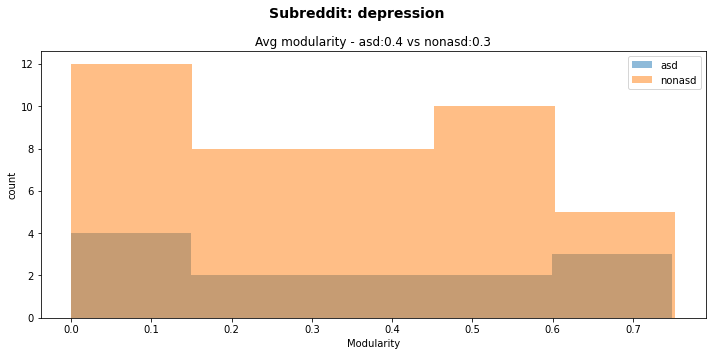

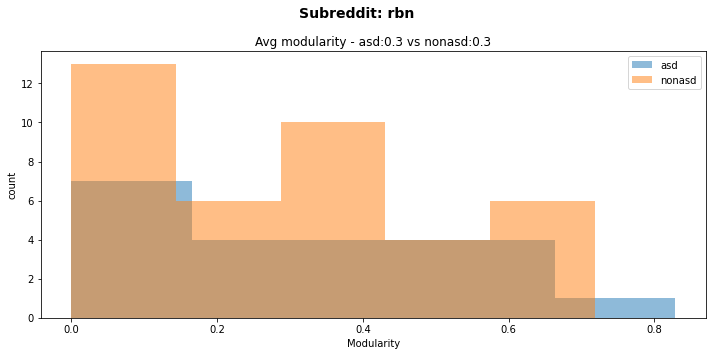

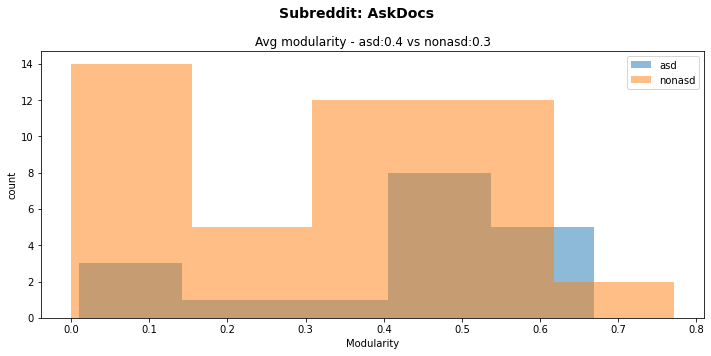

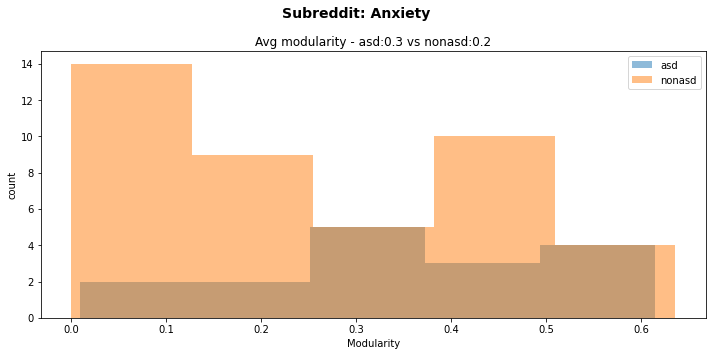

In [171]:
avg_modularity =  {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 

for c in categories:
    figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
    metrics = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category
    for i, label in enumerate(metrics.keys()):
        nets = network[c][label]
        for G in nets:
            modularity = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
            metrics[label].append(modularity)
            avg_modularity[c][label].append(modularity)


    for i, label in enumerate(metrics.keys()):
        ## nodes plot
        axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

    axes.set_title(f'Avg modularity - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
    axes.set_xlabel('Modularity')
    axes.set_ylabel('count')
    # axes.set_xlim((0, max_xlim))
    plt.legend()
    plt.tight_layout()  # Adjust subplot spacing
    plt.show()

In [172]:
# modularity
for c in categories:
    z_stat, p_val = ztest(avg_modularity[c]['asd'], avg_modularity[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: 0.576, p-value: 0.564
There is no significant difference

rbn
  z-statistic: 0.406, p-value: 0.685
There is no significant difference

AskDocs
  z-statistic: 1.459, p-value: 0.145
There is no significant difference

Anxiety
  z-statistic: 1.625, p-value: 0.104
There is no significant difference



### Levene Test

In [173]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_modularity[c]['asd'], avg_modularity[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.589, p-value: 0.446
There is no significant difference

rbn
  test statistic: 0.0, p-value: 0.986
There is no significant difference

AskDocs
  test statistic: 1.769, p-value: 0.188
There is no significant difference

Anxiety
  test statistic: 1.957, p-value: 0.167
There is no significant difference



## Community Detection

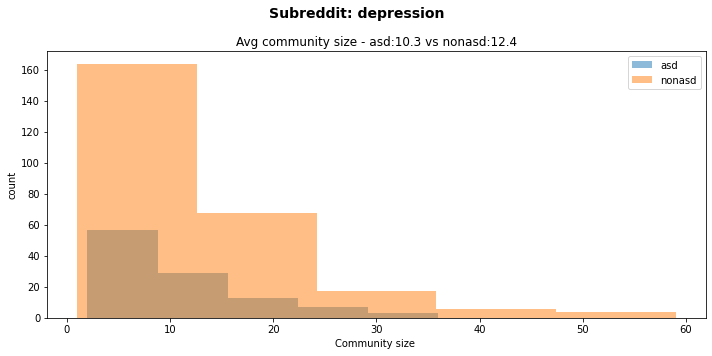

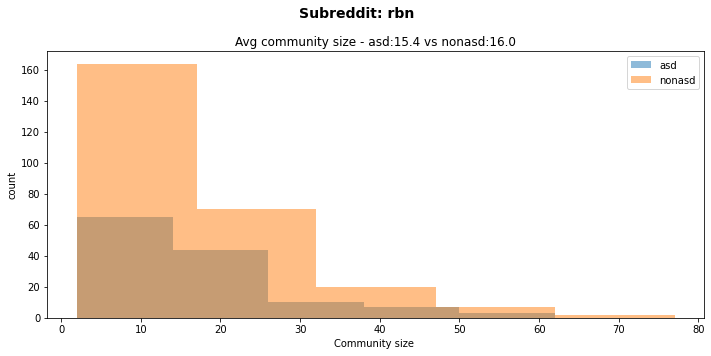

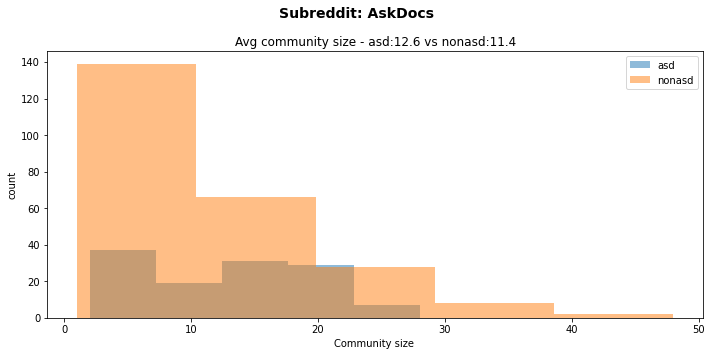

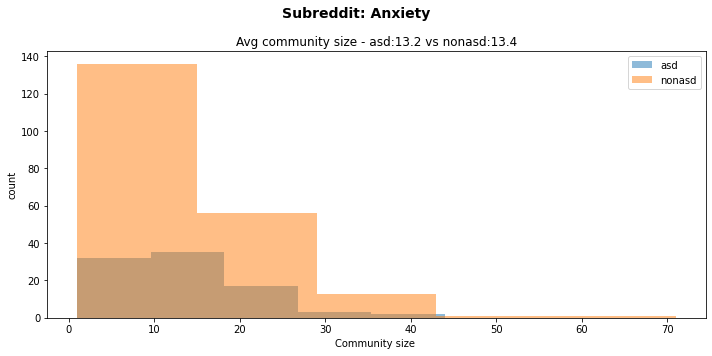

In [174]:
from cdlib import algorithms

avg_comm_size =  {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 

num_comm = {'depression' : {'asd': [], 'nonasd': []},
    'rbn': {'asd': [], 'nonasd': []},
    'AskDocs': {'asd': [], 'nonasd': []},
    'Anxiety': {'asd': [], 'nonasd': []}} 

for c in categories:
    figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
    metrics = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category
    for i, label in enumerate(metrics.keys()):
        nets = network[c][label]
        for G in nets:
            coms = algorithms.louvain(G, randomize=42)
            communities = coms.communities
            community_sizes = [len(comm) for comm in communities]
            metrics[label].extend(community_sizes)
            avg_comm_size[c][label].append(np.mean(community_sizes))
            num_comm[c][label].append(len(community_sizes))

    for i, label in enumerate(metrics.keys()):
        ## nodes plot
        axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

    axes.set_title(f'Avg community size - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
    axes.set_xlabel('Community size ')
    axes.set_ylabel('count')
    # axes.set_xlim((0, max_xlim))
    plt.legend()
    plt.tight_layout()  # Adjust subplot spacing
    plt.show()

## Average community size

### z test

In [175]:
# community size
for c in categories:
    z_stat, p_val = ztest(avg_comm_size[c]['asd'], avg_comm_size[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  z-statistic: -0.761, p-value: 0.446
There is no significant difference

rbn
  z-statistic: 0.222, p-value: 0.824
There is no significant difference

AskDocs
  z-statistic: 0.116, p-value: 0.908
There is no significant difference

Anxiety
  z-statistic: -0.457, p-value: 0.648
There is no significant difference



### Leven Test

In [176]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(avg_comm_size[c]['asd'], avg_comm_size[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.291, p-value: 0.592
There is no significant difference

rbn
  test statistic: 0.017, p-value: 0.897
There is no significant difference

AskDocs
  test statistic: 4.01, p-value: 0.05
There is no significant difference

Anxiety
  test statistic: 1.823, p-value: 0.182
There is no significant difference



### Number of Communities 

### z test 

In [177]:
# num communities
for c in categories:
    z_stat, p_val = ztest(num_comm[c]['asd'], num_comm[c]['nonasd'])
    print('\033[1m' + c +'\033[1m')
    print(f"average number of cummunties: asd = {round(np.mean(num_comm[c]['asd']),3 )} vs nonasd = {round(np.mean(num_comm[c]['nonasd']), 3)}")
    print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
    if p_val < 0.05/4:
        print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
    else:
        print('There is no significant difference')
    print()

depression
average number of cummunties: asd = 8.385 vs nonasd = 6.023
  z-statistic: 2.477, p-value: 0.013
There is no significant difference

rbn
average number of cummunties: asd = 6.45 vs nonasd = 6.744
  z-statistic: -0.351, p-value: 0.725
There is no significant difference

AskDocs
average number of cummunties: asd = 6.833 vs nonasd = 5.4
  z-statistic: 2.419, p-value: 0.016
There is no significant difference

Anxiety
average number of cummunties: asd = 5.562 vs nonasd = 4.929
  z-statistic: 0.907, p-value: 0.364
There is no significant difference



### Leven Test

In [178]:
from scipy.stats import levene

for c in categories:
    statistic, p_value = levene(num_comm[c]['asd'], num_comm[c]['nonasd'])

    print('\033[1m' + c +'\033[1m')
    print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
    if p_value < 0.05/4:
        print('There is significant difference')
    else:
        print('There is no significant difference')
    print()

depression
  test statistic: 0.453, p-value: 0.504
There is no significant difference

rbn
  test statistic: 0.006, p-value: 0.937
There is no significant difference

AskDocs
  test statistic: 0.172, p-value: 0.68
There is no significant difference

Anxiety
  test statistic: 0.217, p-value: 0.643
There is no significant difference



### Plot Random Communities

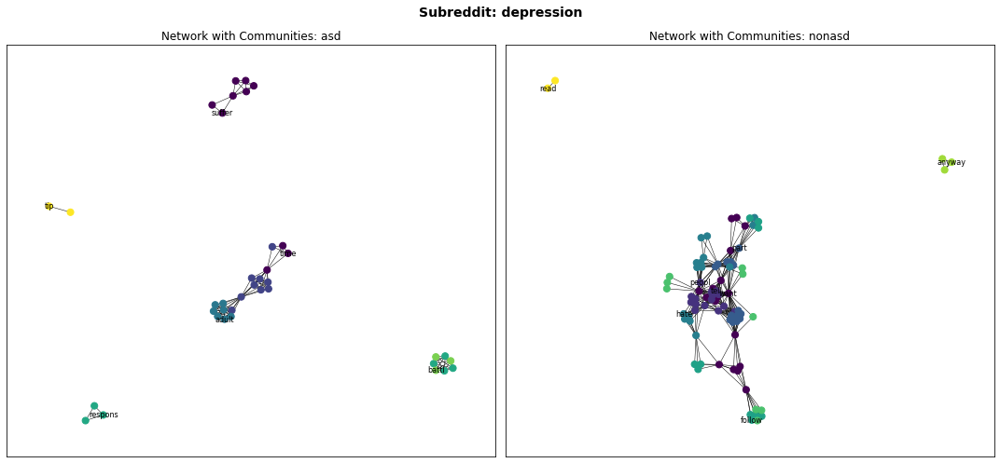

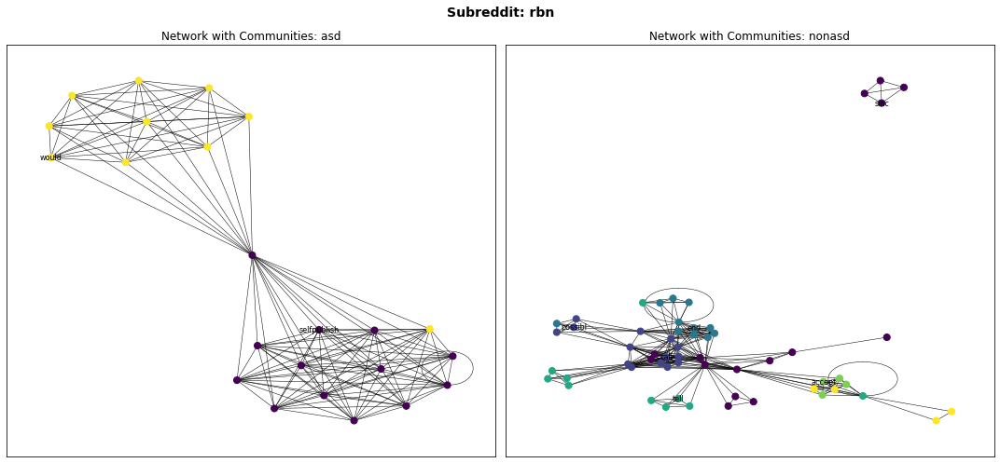

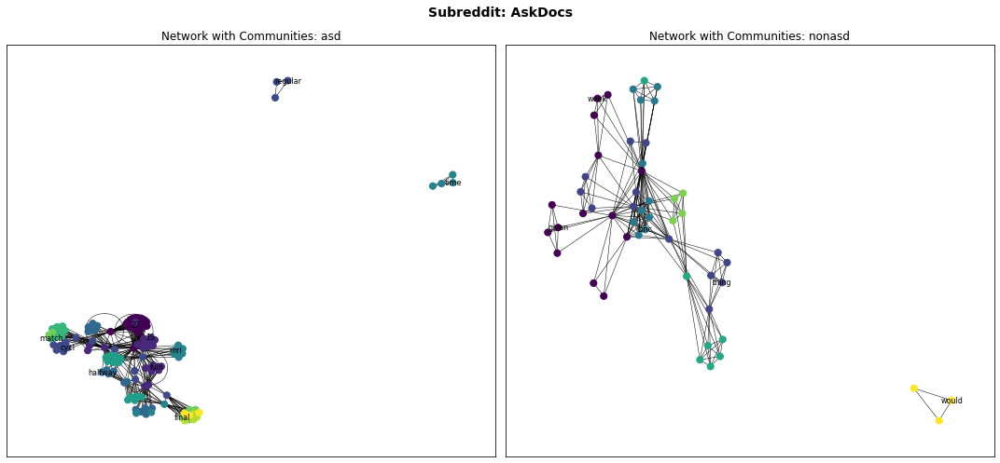

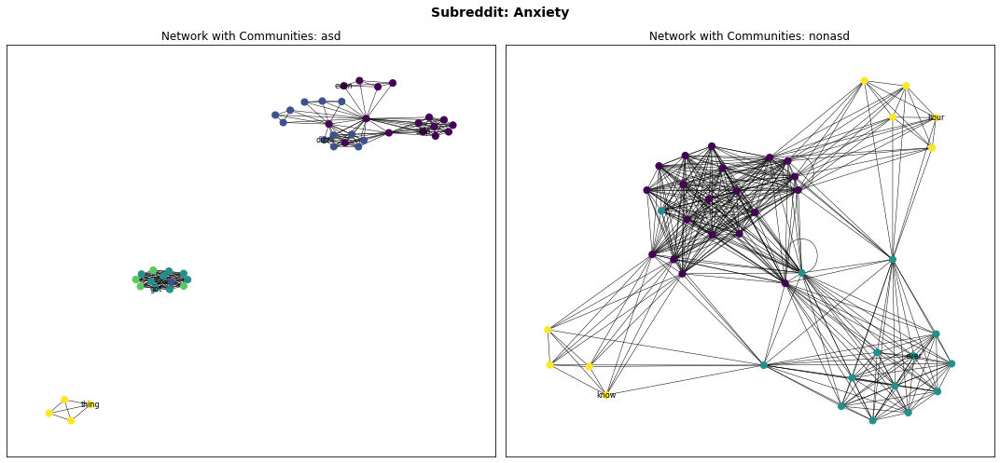

In [179]:
from cdlib import algorithms

for c in categories:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))
    metrics = {'asd': [], 'nonasd': []}
    plt.suptitle(f'Subreddit: {c}', fontsize=14, fontweight='bold')  # Add title for the category

    for i, label in enumerate(metrics.keys()):
        nets = network[c][label]
        communities = []

        # Collect communities from all networks
        net_rand = nets[random.choice(range(len(nets)))]
        coms = algorithms.louvain(net_rand)
        communities.extend(coms.communities)

        # Visualize network with community colors
        ax = axes[i]
        pos = nx.spring_layout(net_rand)
        node_colors = [i % len(communities) for i, comm in enumerate(communities) for _ in comm]
        nx.draw_networkx(net_rand, pos=pos, node_color=node_colors, ax=ax, node_size=50, width=0.5, with_labels=False)
        ax.set_title(f'Network with Communities: {label}')
        # ax.axis('off')

    # Add a sample word from each community
        for idx, comm in enumerate(communities):
            sample_word = random.choice(comm)
            x, y = pos[sample_word]
            ax.text(x, y, sample_word, fontsize=8, ha='center', va='center')



    plt.tight_layout()
    plt.show()

# Stop words analysis 

### Here we analyze only AskDocs

In [180]:
import copy
csv = 'AskDocs.csv'
sub_reddit = subred_dict[csv] 
raw_df = pd.read_csv(os.path.join(path,csv))
askDocs_dict = {"asd": [], "nonasd": []}

# Filter out rows where either the "source" or "target" column contains a stop word
df = raw_df[(raw_df['source'].isin(stop_words) & raw_df['target'].isin(stop_words))]

uids = {"True": [], "False": []}
for flag in [True, False]:
    df_flag = df[df['asd']==flag]
    print(f"{sub_reddit}: {flag}")

    for idx in  df_flag.index_df.unique():
        df_idx = df_flag[df_flag.index_df == idx]
        user = df_idx['user'].values[0]
        if user in uids[str(flag)]:
            continue
        else:
            uids[str(flag)].append(user)
            df_idx_copy = copy.deepcopy(df_idx)
            if flag:
                askDocs_dict["asd"].append(df_idx_copy)
            else:
                askDocs_dict["nonasd"].append(df_idx_copy)

AskDocs: True
AskDocs: False


In [181]:
askDocs_network = {'asd': [], 'nonasd': []}

for group in askDocs_dict.keys():
    df_list = askDocs_dict[group]
    for df in df_list:
        subset_df = df[["source", "target", "weight"]]
        G = nx.Graph()
        G = nx.from_pandas_edgelist(subset_df, edge_attr="weight", create_using=G)
        askDocs_network[group].append(G)

In [182]:
import matplotlib.pyplot as plt
import numpy as np

def plot_network2(label):
    plt.figure(figsize=(20, 20))
    df_curr_list = askDocs_dict[label]
    sampled_df_idx = np.random.choice(range(len(df_curr_list)))
    df_sample = df_curr_list[sampled_df_idx]
    post = df_sample['post'].values[0]
    user = df_sample['user'].values[0]
    weights = np.array(df_sample['weight'])
    normalized_w = weights / np.max(weights)

    # G_ = nx.Graph()
    curr_g = nx.from_pandas_edgelist(df_sample, edge_attr='weight', create_using=nx.Graph())
    print(post)
    pos = nx.circular_layout(curr_g)  # Positions of the nodes in a circular layout
    labels = {node: node for node in curr_g.nodes()}  # Assigning node names as labels

    nx.draw_networkx_nodes(curr_g, pos, node_size=25)
    nx.draw_networkx_edges(curr_g, pos, width=normalized_w)
    nx.draw_networkx_labels(curr_g, pos=pos, labels=labels, font_size=10, font_color=(128 / 255, 0, 0), verticalalignment='bottom', bbox=dict(facecolor='white', edgecolor='none', pad=0.3))

    plt.title(f'{label} sampled network')
    plt.show()

I'm 27F, Caucasian, Australian, 165cm and 100kg. I recently had a cholecystectomy and I had an ECG while admitted but there was no issues noted on my discharge papers. 

For the past year however I've been feeling my heart flip flop in my chest at random times, on average once a week. I sometimes get shortness of breath at the same time. 

I've already asked both my GP and a hospital doctor but they both said that it doesn't sound like I'm having palpitations because according to them that's only skipping a beat... Admittedly I do have PTSD and anxiety so I may not have been explaining right in person. And I don't recall feeling any symptoms of either PTSD or anxiety when the flip flopping happens. 

Should I press for further investigation by a specialist? I do have to admit that I am worried that the anxiety etc and my body weight will continually put stress on my heart. Both of which I am treating. Though the body weight is a bit complicated by an eating disorder, so please assume I

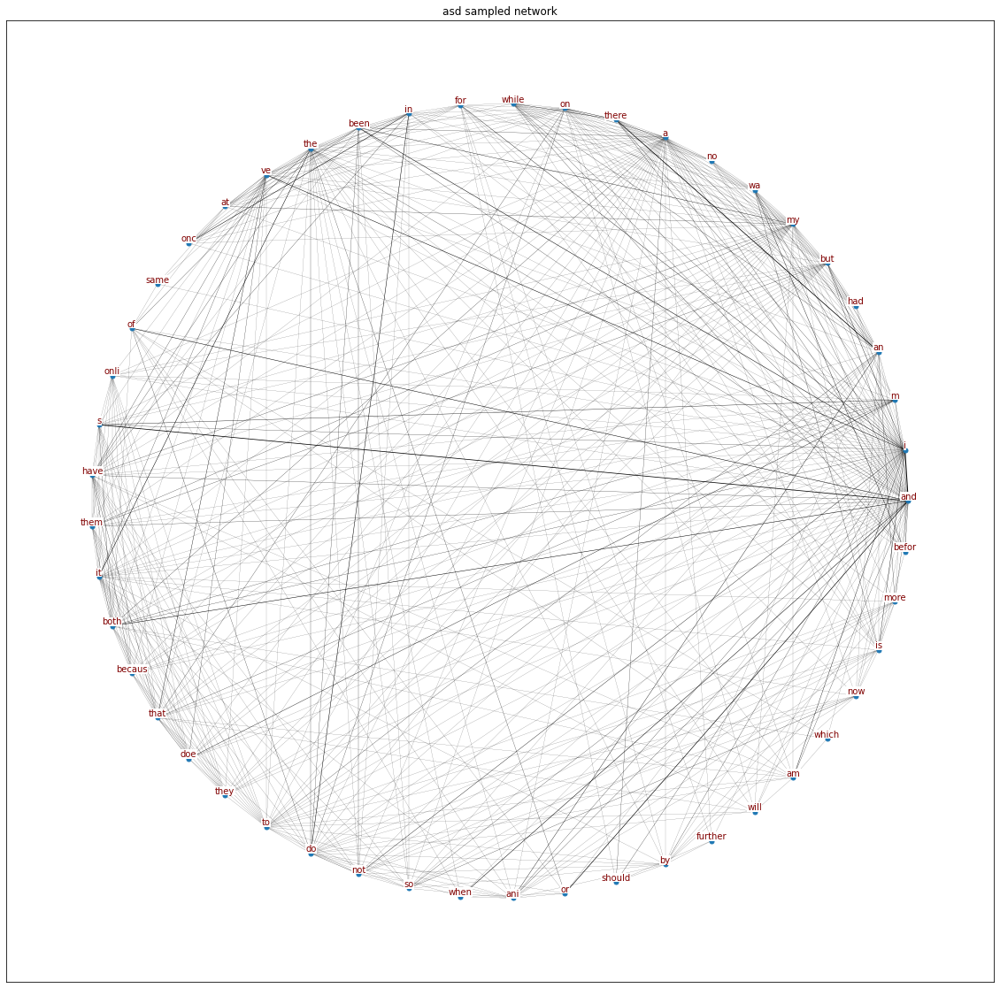

In [183]:
plot_network2('asd')

So for context I’m a 27 year old female. I was recently let go of the hospital after having several seizures and needing to be intubated because I wasn’t protecting my airway. Before I got life flighted the doctor told my mom that it looked like I had a little bit of pneumonia in my lungs from aspirating a tiny bit. He have me a dose of zosyn. That was two days ago and today I woke up hacking and coughed a tiny bit of blood up. Should I go to an urgent care or try to wait this out?


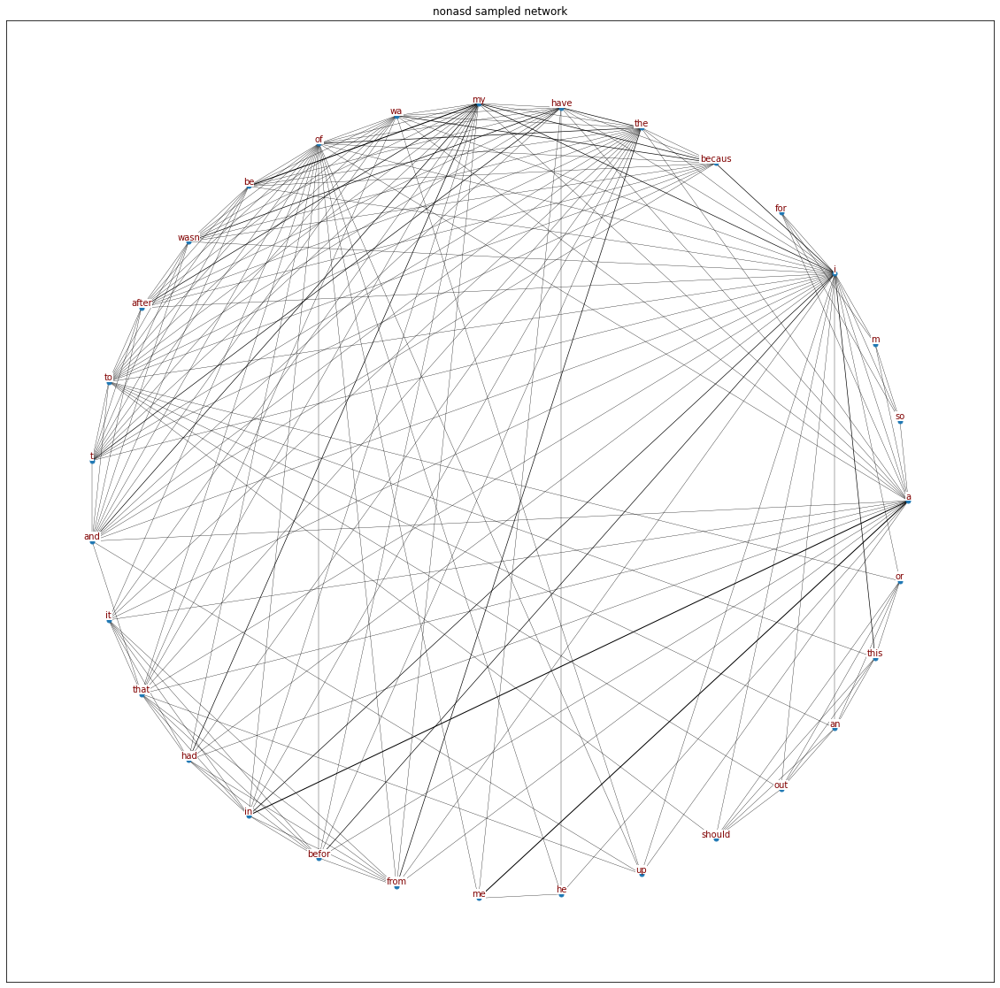

In [184]:
plot_network2('nonasd')

### Nodes, Edges and Degrees

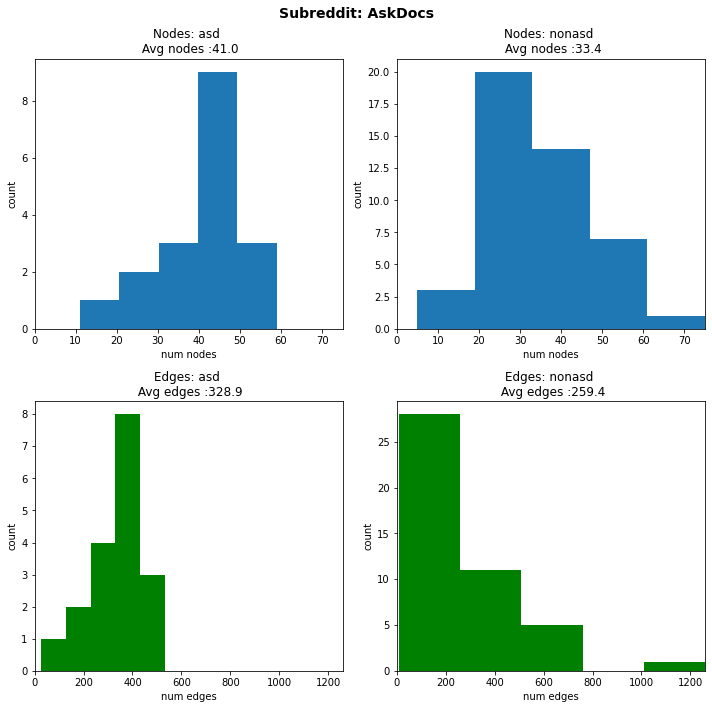

In [185]:
figs, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
num_nodes = {'asd': [], 'nonasd': []}
num_edges = {'asd': [], 'nonasd': []}
plt.suptitle(f'Subreddit: AskDocs', fontsize=14, fontweight='bold')  # Add title for the category
for i, label in enumerate(['asd', 'nonasd']):
    nets = askDocs_network[label]
    for G in nets:
        n_nodes = G.number_of_nodes()
        n_edges = G.number_of_edges()
        num_nodes[label].append(n_nodes)
        num_edges[label].append(n_edges)

max_xlim_nodes = max([max(num_nodes['asd']), max(num_nodes['nonasd'])])
max_xlim_edges = max([max(num_edges['asd']), max(num_edges['nonasd'])])

for i, label in enumerate(['asd', 'nonasd']):

    ## nodes plot
    ax_node = axes[0][i]
    ax_node.hist(num_nodes[label], bins=5)
    ax_node.set_title(f'Nodes: {label} \n Avg nodes :{round(np.mean(num_nodes[label]),1)}')
    ax_node.set_xlabel('num nodes')
    ax_node.set_ylabel('count')
    ax_node.set_xlim((0, max_xlim_nodes))
    ## edges plot
    ax_edge = axes[1][i]
    ax_edge.hist(num_edges[label], bins =5, color="green")
    ax_edge.set_title(f'Edges: {label} \n Avg edges :{round(np.mean(num_edges[label]),1)}')
    ax_edge.set_xlabel('num edges')
    ax_edge.set_ylabel('count')
    ax_edge.set_xlim((0, max_xlim_edges))
plt.tight_layout()  # Adjust subplot spacing
plt.show()

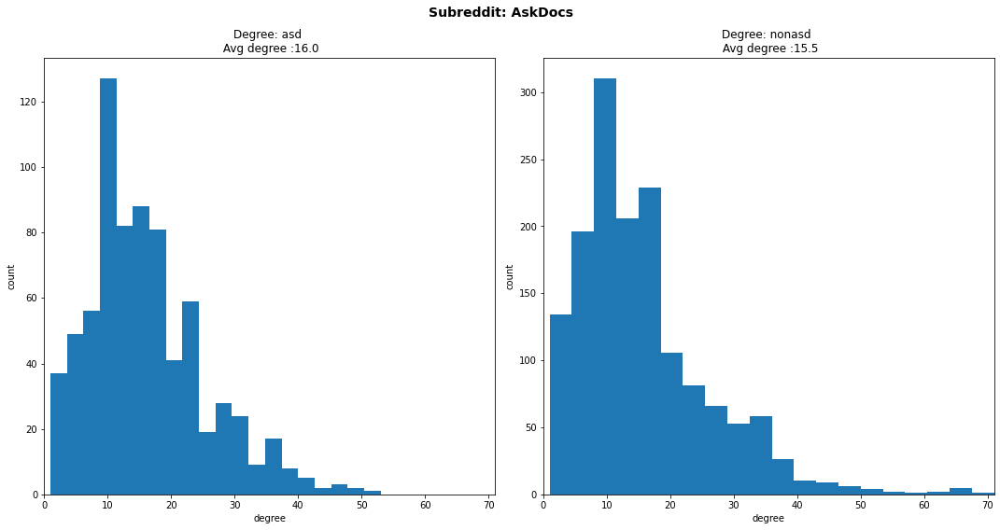

In [186]:
figs, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 8))
degrees = {'asd': [], 'nonasd': []}
plt.suptitle(f'Subreddit: AskDocs', fontsize=14, fontweight='bold')  # Add title for the category
for i, label in enumerate(degrees.keys()):
    nets = askDocs_network[label]
    for G in nets:
        degree_sequence = sorted((d for n, d in G.degree()), reverse=True)
        degrees[label].extend(degree_sequence)

max_xlim = max([max(degrees['asd']), max(degrees['nonasd'])])

for i, label in enumerate(degrees.keys()):
    ## nodes plot
    ax_node = axes[i]
    ax_node.hist(degrees[label], bins=20)
    ax_node.set_title(f'Degree: {label} \n Avg degree :{round(np.mean(degrees[label]),1)}')
    ax_node.set_xlabel('degree')
    ax_node.set_ylabel('count')
    ax_node.set_xlim((0, max_xlim))

plt.tight_layout()  # Adjust subplot spacing
plt.show()

In [187]:
c= 'AskDocs'

### Average degree

### Z test

In [188]:
z_stat, p_val = ztest(degrees['asd'], degrees['nonasd'])
print('\033[1m' + c +'\033[1m')
print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
if p_val < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  z-statistic: 1.182, p-value: 0.237
There is no significant difference



### Levene test

In [189]:
from scipy.stats import levene

statistic, p_value = levene(degrees['asd'], degrees['nonasd'])

print('\033[1m' + c +'\033[1m')
print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
if p_value < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  test statistic: 3.242, p-value: 0.072
There is no significant difference



### Average shortest path

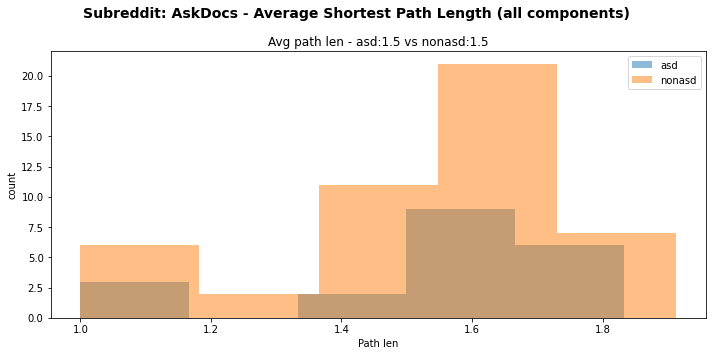

In [190]:

figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
metrics = {'asd': [], 'nonasd': []}
plt.suptitle(f'Subreddit: AskDocs - Average Shortest Path Length (all components)', fontsize=14, fontweight='bold')  # Add title for the category
for i, label in enumerate(metrics.keys()):
    nets = askDocs_network[label]
    for G in nets:
        sequences = []
        for C in (G.subgraph(c).copy() for c in nx.connected_components(G)):
            sequence = nx.average_shortest_path_length(C)
            sequences.append(sequence)
        metrics[label].extend(sequences)


for i, label in enumerate(metrics.keys()):
    ## nodes plot
    axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

axes.set_title(f'Avg path len - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
axes.set_xlabel('Path len')
axes.set_ylabel('count')
# axes.set_xlim((0, max_xlim))
plt.legend()
plt.tight_layout()  # Adjust subplot spacing
plt.show()

### Z test

In [191]:
z_stat, p_val = ztest(metrics['asd'], metrics['nonasd'])
print('\033[1m' + c +'\033[1m')
print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
if p_val < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  z-statistic: 0.035, p-value: 0.972
There is no significant difference



## Levene test

In [192]:
statistic, p_value = levene(metrics['asd'], metrics['nonasd'])

print('\033[1m' + c +'\033[1m')
print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
if p_value < 0.05/4:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  test statistic: 0.207, p-value: 0.651
There is no significant difference



### Modularity

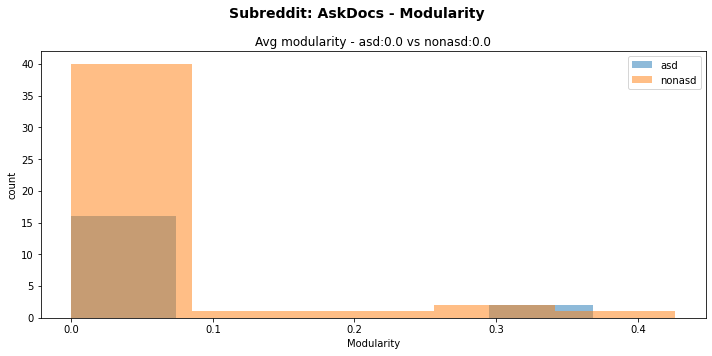

In [193]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
metrics = {'asd': [], 'nonasd': []}
plt.suptitle(f'Subreddit: AskDocs - Modularity', fontsize=14, fontweight='bold')  # Add title for the category
for i, label in enumerate(metrics.keys()):
    nets = askDocs_network[label]
    for G in nets:
        modularity = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
        metrics[label].append(modularity)


for i, label in enumerate(metrics.keys()):
    ## nodes plot
    axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

axes.set_title(f'Avg modularity - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
axes.set_xlabel('Modularity')
axes.set_ylabel('count')
# axes.set_xlim((0, max_xlim))
plt.legend()
plt.tight_layout()  # Adjust subplot spacing
plt.show()

### Z test

In [194]:
z_stat, p_val = ztest(metrics['asd'], metrics['nonasd'])
print('\033[1m' + c +'\033[1m')
print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
if p_val < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  z-statistic: 0.201, p-value: 0.841
There is no significant difference



### Levene test

In [195]:
statistic, p_value = levene(metrics['asd'], metrics['nonasd'])

print('\033[1m' + c +'\033[1m')
print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
if p_value < 0.05/4:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  test statistic: 0.04, p-value: 0.842
There is no significant difference



## Community detection

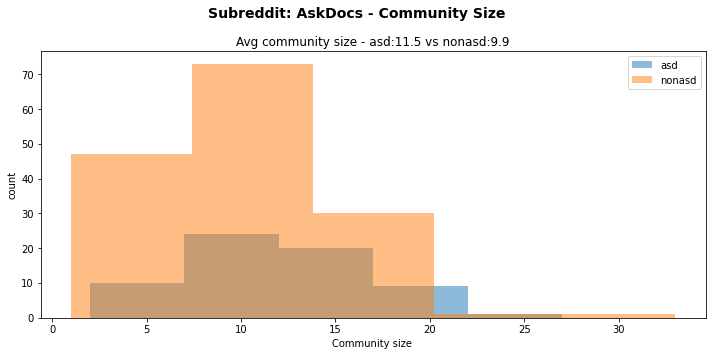

In [196]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))
metrics = {'asd': [], 'nonasd': []}
avg_comm_size =  {'asd': [], 'nonasd': []}
num_comm = {'asd': [], 'nonasd': []}

plt.suptitle(f'Subreddit: AskDocs - Community Size', fontsize=14, fontweight='bold')  # Add title for the category
for i, label in enumerate(metrics.keys()):
    nets = askDocs_network[label]
    for G in nets:
        coms = algorithms.louvain(G, randomize=42)
        communities = coms.communities
        community_sizes = [len(comm) for comm in communities]
        metrics[label].extend(community_sizes)
        avg_comm_size[label].append(np.mean(community_sizes))
        num_comm[label].append(len(community_sizes))


for i, label in enumerate(metrics.keys()):
    ## nodes plot
    axes.hist(metrics[label], bins=5, alpha=0.5, label=label)

axes.set_title(f'Avg community size - asd:{round(np.mean(metrics["asd"]),1)} vs nonasd:{round(np.mean(metrics["nonasd"]),1)}')
axes.set_xlabel('Community size ')
axes.set_ylabel('count')
# axes.set_xlim((0, max_xlim))
plt.legend()
plt.tight_layout()  # Adjust subplot spacing
plt.show()

## Average community size

### Z test

In [197]:
z_stat, p_val = ztest(avg_comm_size['asd'], avg_comm_size['nonasd'])
print('\033[1m' + c +'\033[1m')
print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
if p_val < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  z-statistic: 2.132, p-value: 0.033
There is significant difference



### Levene test

In [198]:
statistic, p_value = levene(avg_comm_size['asd'], avg_comm_size['nonasd'])

print('\033[1m' + c +'\033[1m')
print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
if p_value < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  test statistic: 0.172, p-value: 0.68
There is no significant difference



## Number of communities

### Z test

In [199]:
z_stat, p_val = ztest(num_comm['asd'], num_comm['nonasd'])
print('\033[1m' + c +'\033[1m')
print(f"\033[0m  z-statistic: {round(z_stat,3)}, p-value: {round(p_val,3)}")
if p_val < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  z-statistic: 0.697, p-value: 0.486
There is no significant difference



### Levene test

In [200]:
from scipy.stats import levene

statistic, p_value = levene(num_comm['asd'], num_comm['nonasd'])

print('\033[1m' + c +'\033[1m')
print(f"\033[0m  test statistic: {round(statistic,3)}, p-value: {round(p_value,3)}")
if p_value < 0.05:
    print('\x1b[6;30;42m' + 'There is significant difference' + '\x1b[0m')
else:
    print('There is no significant difference')
print()

AskDocs
  test statistic: 0.417, p-value: 0.521
There is no significant difference

